In [ ]:
!pip install numpy==1.24.3 --force-reinstall --upgrade
!pip install shap==0.43.0 catboost --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 20.0 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.24.3 which is incompatible.
albumentations 2.0.5 requires numpy>=1.24.4, but you have numpy 1.24.3 which is incompatible.
jax 0.5.2 requires numpy>=1.25, but you have numpy 1.24.3 which is incompatible.
albucore 0.0.23 requires numpy>=1.24.4, but you have numpy 1.24.3 which is incompatible.
blosc2 3.3.0 requires numpy>=1.26, but you have numpy 1.24.3 which is incompatible.
jaxlib 0.5.1 requires numpy>=1.25, but you have numpy 1.24.3 which is incompatible.
treescope 0.1.9 requires numpy>=1.25.2, but you have numpy 1.24.3 which is 

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 22.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 9.8 MB/s eta 0:00:00
ERROR: Operation cancelled by user
^C


In [ ]:
from google.colab import drive
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression, Ridge, Lasso
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, r2_score

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
file_path = '/content/drive/My Drive/CUSP Capstone/10marchfinal-1.csv'
RLI_path = '/content/drive/My Drive/CUSP Capstone/Final_Data/RLI_CBG_MSA.csv'

In [ ]:
df = pd.read_csv(file_path)
df_rli = pd.read_csv(RLI_path)

<ipython-input-4-011aedc8ea64>:1: DtypeWarning: Columns (225,260,360) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


In [ ]:
if df.empty:
    raise ValueError("Error: Loaded dataset is empty. Check file content.")
if df_rli.empty:
    raise ValueError("Error: RLI dataset is empty. Check file content.")

In [ ]:
numeric_cols = df.select_dtypes(include=[np.number]).columns
categorical_cols = df.select_dtypes(include=['object']).columns

In [ ]:
df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].median())
df[categorical_cols] = df[categorical_cols].fillna(df[categorical_cols].mode().iloc[0])

In [ ]:
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col].astype(str))
    label_encoders[col] = le
df.fillna(0, inplace=True)

In [ ]:
print("Dataset shape before split:", df.shape)
if df.shape[0] == 0:
    raise ValueError("Error: No data remaining after preprocessing. Check for excessive NaNs.")

Dataset shape before split: (20831, 463)


In [ ]:
df.columns = df.columns.str.strip()
print("Columns in dataset:", df.columns.tolist())
if 'democrats' in df.columns and 'republicans' in df.columns:
    y = (df['democrats'] > df['republicans']).astype(int)
else:
    raise KeyError("Missing 'per_dem' or 'per_rep' column in the dataset. Check the dataset structure.")
df.drop(columns=['democrats', 'republicans', 'GEO_ID'], errors='ignore', inplace=True)

Columns in dataset: ['Unnamed: 0_x', 'GEO_ID', 'STATEFP', 'COUNTYFP', 'TRACTCE', 'BLKGRPCE', 'NAMELSAD', 'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT', 'INTPTLON', 'index_righ', 'cartodb_id', 'geoid_1', 'name', 'atotal', 'aland_1', 'emtot_00', 'emtot_21', 'emtot_0021', 'emind_21', 'emins_21', 'emoff_21', 'empr_21', 'emser_21', 'emind_1021', 'emins_1021', 'emoff_1021', 'empr_1021', 'emser_1021', 'gdp_20', 'gdp_1020', 'gdpa_1020', 'lf_20e', 'lf_20m', 'lf_20c', 'lfpw_20e', 'lfpw_20m', 'lfpw_20c', 'lf65_20e', 'lf65_20m', 'lf65_20c', 'popfb_20e', 'popfb_20m', 'popfb_20c', 'popfbp_20e', 'popfbp_20m', 'popfbp_20c', 'houo_20e', 'houo_20m', 'houo_20c', 'hour_20e', 'hour_20m', 'hour_20c', 'houv_20e', 'houv_20m', 'houv_20c', 'hou1u_20e', 'hou1u_20m', 'hou1u_20c', 'hou24u_20e', 'hou24u_20m', 'hou24u_20c', 'hou5u_20e', 'hou5u_20m', 'hou5u_20c', 'lf_10e', 'lf_10m', 'lf_10c', 'lfpw_10e', 'lfpw_10m', 'lfpw_10c', 'lf65_10e', 'lf65_10m', 'lf65_10c', 'lf_1020e', 'lf_1020m', 'lf_1020c', 'lfpw_1020e',

In [ ]:
try:
    X_train, X_test, y_train, y_test = train_test_split(df, y, test_size=0.2, random_state=42)
except ValueError as e:
    print("Error in train_test_split:", e)
    print("Possible cause: Dataset is too small or empty after preprocessing.")
    raise

In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
models = {
    "Linear Regression": LinearRegression(),
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Ridge Regression": Ridge(alpha=1.0),
    "Lasso Regression": Lasso(alpha=0.1),
    "Random Forest Classifier": RandomForestClassifier(n_estimators=100, random_state=42),
    "Random Forest Regressor": RandomForestRegressor(n_estimators=100, random_state=42)
}
best_model = None
best_score = -np.inf

In [ ]:
for name, model in models.items():
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)

    if name == "Linear Regression":
        score = r2_score(y_test, predictions)
        print(f"{name} R^2 Score: {score:.2f}")
    else:
        accuracy = accuracy_score(y_test, predictions.round())
        print(f"{name} Accuracy: {accuracy:.2f}")
        score = accuracy

    if score > best_score:
        best_score = score
        best_model = name

print("Best Model:", best_model)

Linear Regression R^2 Score: 0.71
Logistic Regression Accuracy: 0.99
Ridge Regression Accuracy: 0.98
Lasso Regression Accuracy: 0.90
Random Forest Classifier Accuracy: 0.99
Random Forest Regressor Accuracy: 1.00
Best Model: Random Forest Regressor


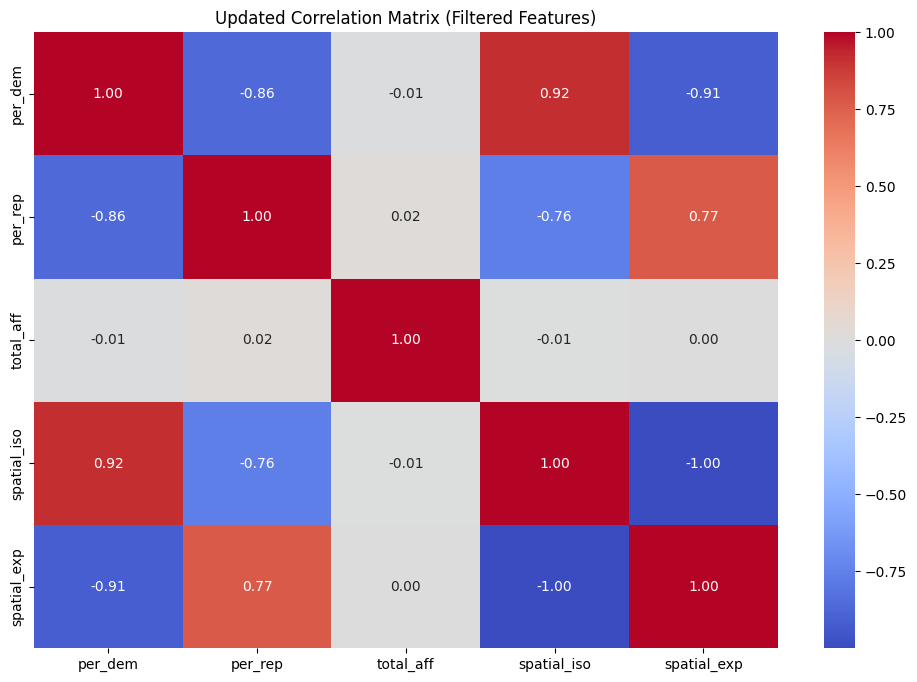

In [ ]:
plt.figure(figsize=(12, 8))
corr_matrix = df[['per_dem', 'per_rep', 'total_aff', 'spatial_iso', 'spatial_exp']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Updated Correlation Matrix (Filtered Features)")
plt.show()

**Identifying Neighborhoods with Similar Voting Behaviors**

<ipython-input-16-c1741f039e3c>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['cluster'] = kmeans.fit_predict(cluster_features)


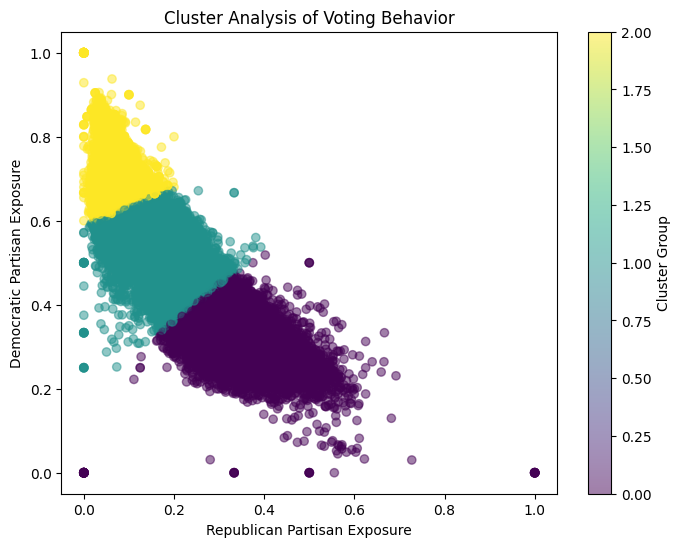

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

cluster_features = df[['per_dem', 'per_rep', 'total_aff']]
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
df['cluster'] = kmeans.fit_predict(cluster_features)

plt.figure(figsize=(8, 6))
plt.scatter(df['per_rep'], df['per_dem'], c=df['cluster'], cmap='viridis', alpha=0.5)
plt.xlabel("Republican Partisan Exposure")
plt.ylabel("Democratic Partisan Exposure")
plt.title("Cluster Analysis of Voting Behavior")
plt.colorbar(label="Cluster Group")
plt.show()

**Exploring Correlation of Income, Racial Diversity, and Education with Partisanship**


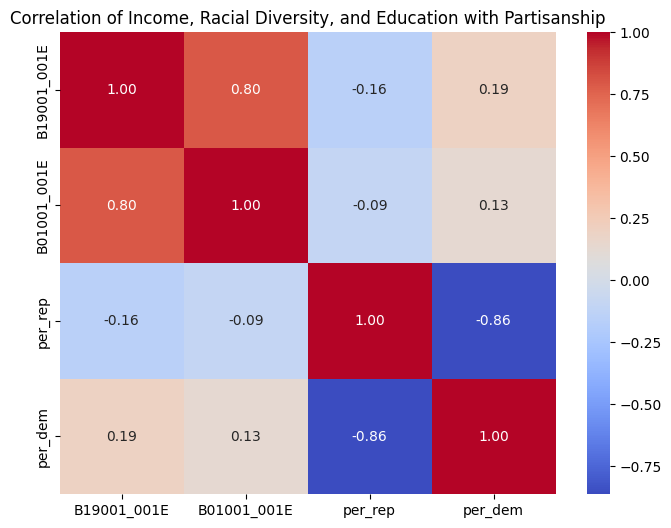

In [ ]:
import seaborn as sns

features = ['B19001_001E', 'B01001_001E', 'per_rep', 'per_dem']
corr_matrix = df[features].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation of Income, Racial Diversity, and Education with Partisanship")
plt.show()

**Gradient Boosting, SVM, Neural Networks**

In [ ]:
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC

extra_models = {
    "Gradient Boosting": GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric="logloss"),
    "SVM": SVC(kernel="linear", probability=True)
}

for name, model in extra_models.items():
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    accuracy = accuracy_score(y_test, predictions)
    print(f"{name} Accuracy: {accuracy:.2f}")

Gradient Boosting Accuracy: 1.00


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:43:15] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


XGBoost Accuracy: 1.00
SVM Accuracy: 1.00


**Demographic Insights
Income Level vs. Partisan Exposure (Box Plot)**

<ipython-input-19-d912e887e03c>:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['income_category'] = pd.qcut(df['B19001_001E'], q=3, labels=["Low", "Middle", "High"])


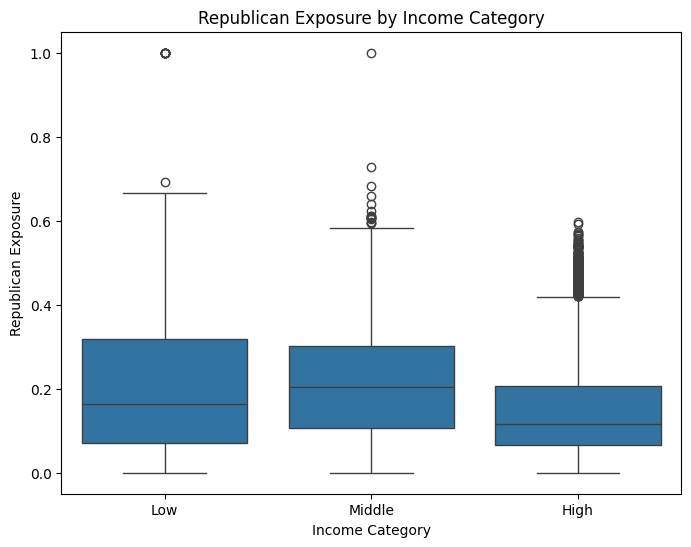

In [ ]:
df['income_category'] = pd.qcut(df['B19001_001E'], q=3, labels=["Low", "Middle", "High"])

plt.figure(figsize=(8, 6))
sns.boxplot(x=df['income_category'], y=df['per_rep'])
plt.title("Republican Exposure by Income Category")
plt.xlabel("Income Category")
plt.ylabel("Republican Exposure")
plt.show()

**K-Means Clustering for Partisan Segregation**

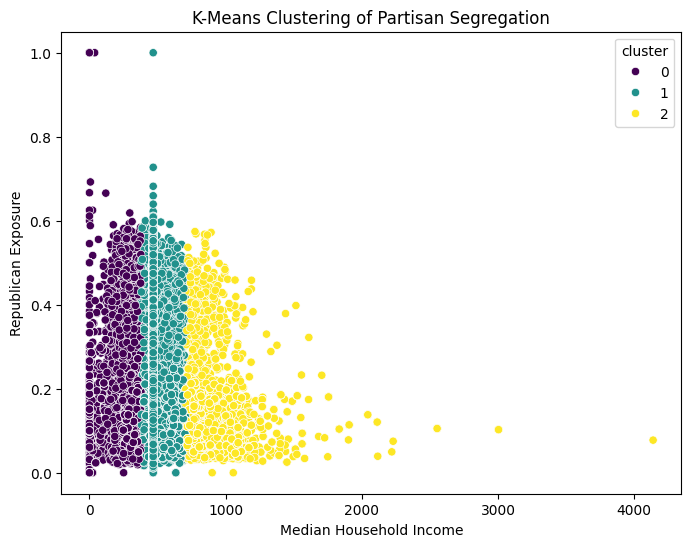

In [ ]:
from sklearn.cluster import KMeans

cluster_features = df[['per_dem', 'per_rep', 'B19001_001E']]
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
df['cluster'] = kmeans.fit_predict(cluster_features)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=df['B19001_001E'], y=df['per_rep'], hue=df['cluster'], palette='viridis')
plt.xlabel("Median Household Income")
plt.ylabel("Republican Exposure")
plt.title("K-Means Clustering of Partisan Segregation")
plt.show()

**Hierarchical Clustering**

  Using cached catboost-1.2.8-cp311-cp311-manylinux2014_x86_64.whl.metadata (1.2 kB)
Using cached catboost-1.2.8-cp311-cp311-manylinux2014_x86_64.whl (99.2 MB)


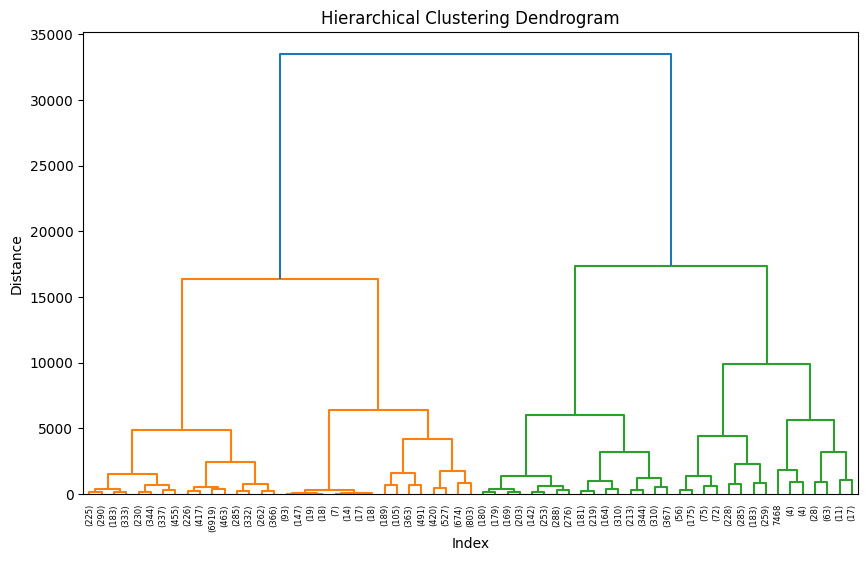

In [ ]:
!pip install catboost
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import dendrogram, linkage

linked = linkage(cluster_features, method='ward')

plt.figure(figsize=(10, 6))
dendrogram(linked, labels=df.index, truncate_mode='level', p=5)
plt.title("Hierarchical Clustering Dendrogram")
plt.xlabel("Index")
plt.ylabel("Distance")
plt.show()

**Gradient Boosting Models**

In [ ]:
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

extra_models = {
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric="logloss"),
    "LightGBM": LGBMClassifier(),
    "CatBoost": CatBoostClassifier(verbose=0)
}

for name, model in extra_models.items():
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    accuracy = accuracy_score(y_test, predictions)
    print(f"{name} Accuracy: {accuracy:.2f}")

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [01:44:38] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


XGBoost Accuracy: 1.00


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Number of positive: 13600, number of negative: 3064
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.060782 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 43643
[LightGBM] [Info] Number of data points in the train set: 16664, number of used features: 252
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.816131 -> initscore=1.490349
[LightGBM] [Info] Start training from score 1.490349


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


LightGBM Accuracy: 1.00
CatBoost Accuracy: 1.00


**Education Level vs Partisan Segregation**

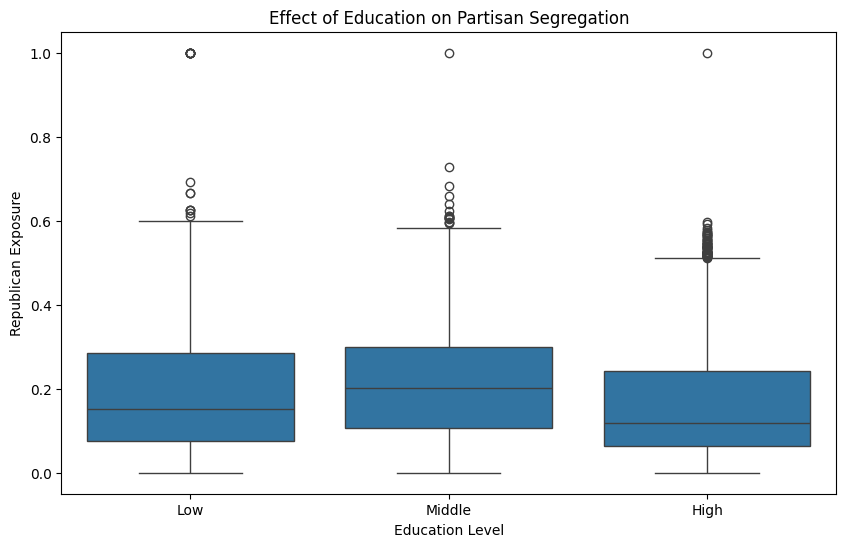

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=pd.qcut(df['B14002_001E'], q=3, labels=["Low", "Middle", "High"]), y=df['per_rep'])
plt.xlabel("Education Level")
plt.ylabel("Republican Exposure")
plt.title("Effect of Education on Partisan Segregation")
plt.show()

**RLI vs. Republican Exposure (Scatter Plot)**

In [ ]:
print(df.columns)

Index(['Unnamed: 0_x', 'STATEFP', 'COUNTYFP', 'TRACTCE', 'BLKGRPCE',
       'NAMELSAD', 'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER',
       ...
       'B14002_048E', 'B14002_048M', 'B14002_049E', 'B14002_049M',
       'Unnamed: 100_y', 'RLI_x', 'Unnamed: 0_y', 'RLI_y', 'cluster',
       'income_category'],
      dtype='object', length=462)


In [ ]:
print([col for col in df.columns if 'RLI' in col])

['RLI_x', 'RLI_y']


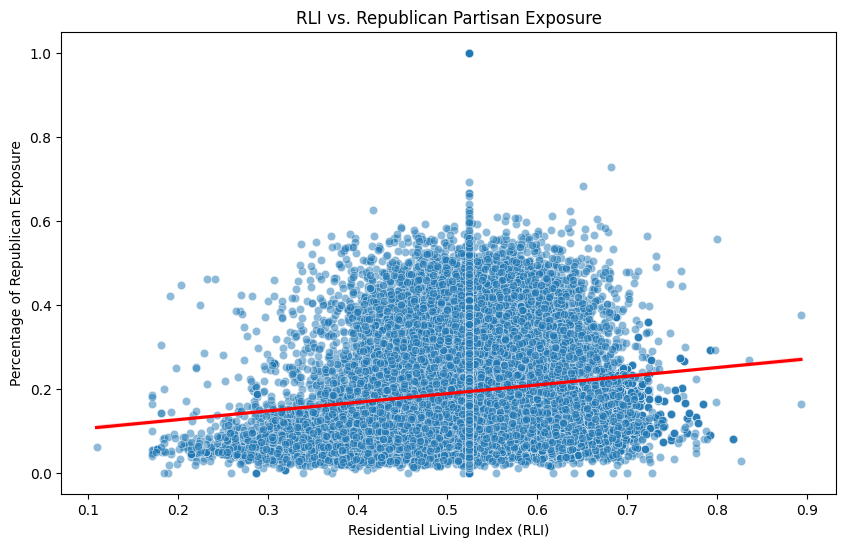

In [ ]:
plt.figure(figsize=(10, 6))

sns.scatterplot(x=df["RLI_x"], y=df["per_rep"], alpha=0.5)
sns.regplot(x=df["RLI_x"], y=df["per_rep"], scatter=False, color="red")

plt.xlabel("Residential Living Index (RLI)")
plt.ylabel("Percentage of Republican Exposure")
plt.title("RLI vs. Republican Partisan Exposure")

plt.show()

**RLI vs. Income Levels (Box Plot)**

Index(['Unnamed: 0_x', 'STATEFP', 'COUNTYFP', 'TRACTCE', 'BLKGRPCE',
       'NAMELSAD', 'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER',
       ...
       'B14002_048E', 'B14002_048M', 'B14002_049E', 'B14002_049M',
       'Unnamed: 100_y', 'RLI_x', 'Unnamed: 0_y', 'RLI_y', 'cluster',
       'income_category'],
      dtype='object', length=462)


<ipython-input-27-da26116dc87c>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="income_category", y="RLI_x", data=df, palette="coolwarm")


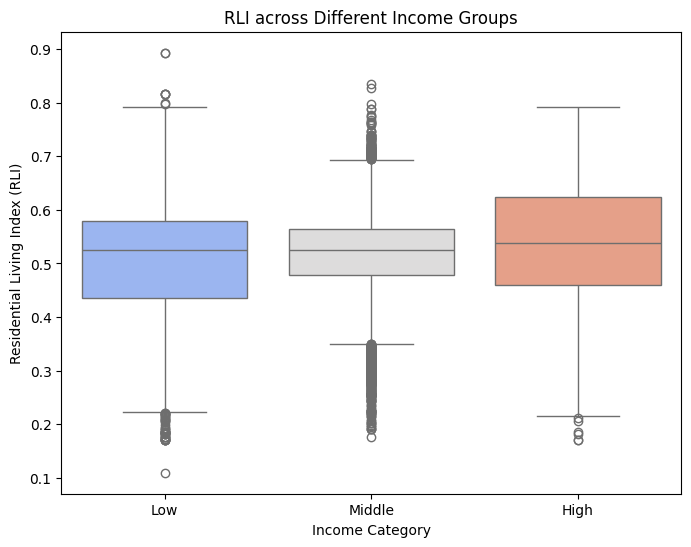

In [ ]:
print(df.columns)
plt.figure(figsize=(8, 6))
sns.boxplot(x="income_category", y="RLI_x", data=df, palette="coolwarm")
plt.xlabel("Income Category")
plt.ylabel("Residential Living Index (RLI)")
plt.title("RLI across Different Income Groups")
plt.show()

In [ ]:
print(df[['RLI_x', 'RLI_y']].describe())

              RLI_x         RLI_y
count  20831.000000  20831.000000
mean       0.520117      0.520117
std        0.101945      0.101945
min        0.109767      0.109767
25%        0.455907      0.455907
50%        0.524421      0.524421
75%        0.591356      0.591356
max        0.893101      0.893101


In [ ]:
income_bins = {
    "B19001_002E": 5000,    # Less than $10,000
    "B19001_003E": 15000,   # $10,000 - $14,999
    "B19001_004E": 20000,   # $15,000 - $19,999
    "B19001_005E": 25000,   # $20,000 - $24,999
    "B19001_006E": 30000,   # $25,000 - $29,999
    "B19001_007E": 35000,   # $30,000 - $34,999
    "B19001_008E": 40000,   # $35,000 - $39,999
    "B19001_009E": 45000,   # $40,000 - $44,999
    "B19001_010E": 50000,   # $45,000 - $49,999
    "B19001_011E": 60000,   # $50,000 - $59,999
    "B19001_012E": 75000,   # $60,000 - $74,999
    "B19001_013E": 100000,  # $75,000 - $99,999
    "B19001_014E": 125000,  # $100,000 - $124,999
    "B19001_015E": 150000,  # $125,000 - $149,999
    "B19001_016E": 175000,  # $150,000 - $199,999
    "B19001_017E": 250000   # $200,000+
}


In [ ]:
df["Estimated_Income"] = sum(df[col] * midpoint for col, midpoint in income_bins.items()) / df["B19001_001E"]

<ipython-input-30-476df423bae4>:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["Estimated_Income"] = sum(df[col] * midpoint for col, midpoint in income_bins.items()) / df["B19001_001E"]


In [ ]:
df["per_dem_binary"] = (df["per_dem"] > 0.5).astype(int)
df["per_rep_binary"] = (df["per_rep"] > 0.5).astype(int)

df["Income_per_Democrats"] = df["Estimated_Income"] * df["per_dem_binary"]
df["Income_per_Republicans"] = df["Estimated_Income"] * df["per_rep_binary"]

<ipython-input-31-fb478d33d16a>:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["per_dem_binary"] = (df["per_dem"] > 0.5).astype(int)
<ipython-input-31-fb478d33d16a>:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["per_rep_binary"] = (df["per_rep"] > 0.5).astype(int)
<ipython-input-31-fb478d33d16a>:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get

In [ ]:
print(df.columns)

Index(['Unnamed: 0_x', 'STATEFP', 'COUNTYFP', 'TRACTCE', 'BLKGRPCE',
       'NAMELSAD', 'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER',
       ...
       'RLI_x', 'Unnamed: 0_y', 'RLI_y', 'cluster', 'income_category',
       'Estimated_Income', 'per_dem_binary', 'per_rep_binary',
       'Income_per_Democrats', 'Income_per_Republicans'],
      dtype='object', length=467)


In [ ]:
X_columns = [col for col in [
    "RLI_x", "spatial_exp", "spatial_iso", "per_dem", "per_rep",
    "Income_per_Young", "Income_per_Older", "Income_per_Democrats",
    "Income_per_Republicans"
] if col in df.columns]

X = df[X_columns]
Y = df["Estimated_Income"]

In [ ]:
if "B01001_003E" in df.columns:
    df["Income_per_Young"] = df["Estimated_Income"] / (df["B01001_003E"] + 1)

if "B01001_049E" in df.columns:
    df["Income_per_Older"] = df["Estimated_Income"] / (df["B01001_049E"] + 1)

<ipython-input-34-3f645a1df35d>:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["Income_per_Young"] = df["Estimated_Income"] / (df["B01001_003E"] + 1)
<ipython-input-34-3f645a1df35d>:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["Income_per_Older"] = df["Estimated_Income"] / (df["B01001_049E"] + 1)


In [ ]:
X = df[['RLI_x', 'spatial_exp', 'spatial_iso', 'per_dem', 'per_rep', 'Income_per_Young', 'Income_per_Older', 'Income_per_Democrats', 'Income_per_Republicans']]
y = df['Estimated_Income']

In [ ]:
from sklearn.preprocessing import StandardScaler

X = df[['RLI_x', 'spatial_exp', 'spatial_iso', 'per_dem', 'per_rep',
        'Income_per_Young', 'Income_per_Older', 'Income_per_Democrats', 'Income_per_Republicans']]
y = df['Estimated_Income']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_scaled = np.nan_to_num(X_train_scaled)
X_test_scaled = np.nan_to_num(X_test_scaled)

y_train = np.nan_to_num(y_train)
y_test = np.nan_to_num(y_test)

print("X_train_scaled shape:", X_train_scaled.shape)
print("X_test_scaled shape:", X_test_scaled.shape)

X_train_scaled shape: (16664, 9)
X_test_scaled shape: (4167, 9)


In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

gbr = GradientBoostingRegressor(random_state=42)

param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7]
}

grid_search = GridSearchCV(gbr, param_grid, cv=3, scoring='r2', n_jobs=-1, error_score='raise')
grid_search.fit(X_train_scaled, y_train)

best_model = grid_search.best_estimator_
print(f"Best Parameters: {grid_search.best_params_}")

y_pred = best_model.predict(X_test_scaled)

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Absolute Error: {mae}")
print(f"Mean Squared Error: {mse}")
print(f"R-Squared Score: {r2}")

Best Parameters: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100}
Mean Absolute Error: 2741.649160213428
Mean Squared Error: 75653418.4150593
R-Squared Score: 0.9512635233568884


 97%|=================== | 4036/4167 [00:23<00:00]       

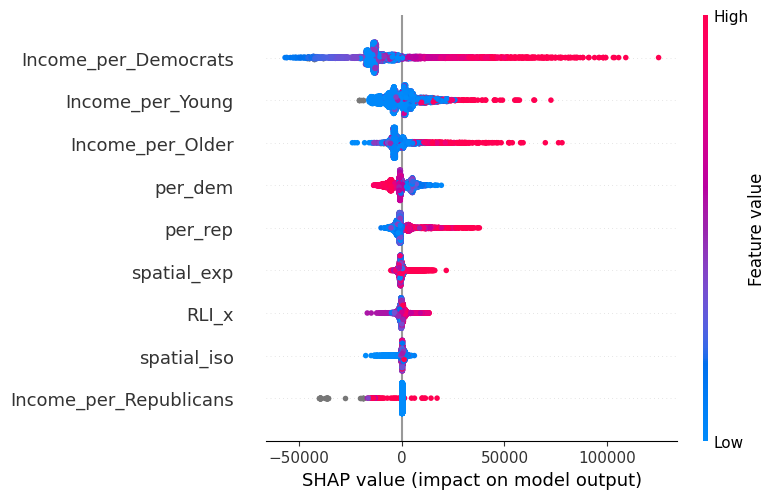

In [ ]:
import shap
import matplotlib.pyplot as plt
import seaborn as sns

explainer = shap.Explainer(best_model, X_train_scaled)
shap_values = explainer(X_test_scaled)

plt.figure(figsize=(8,6))
shap.summary_plot(shap_values, X_test, feature_names=X.columns)

Income Distribution Analysis

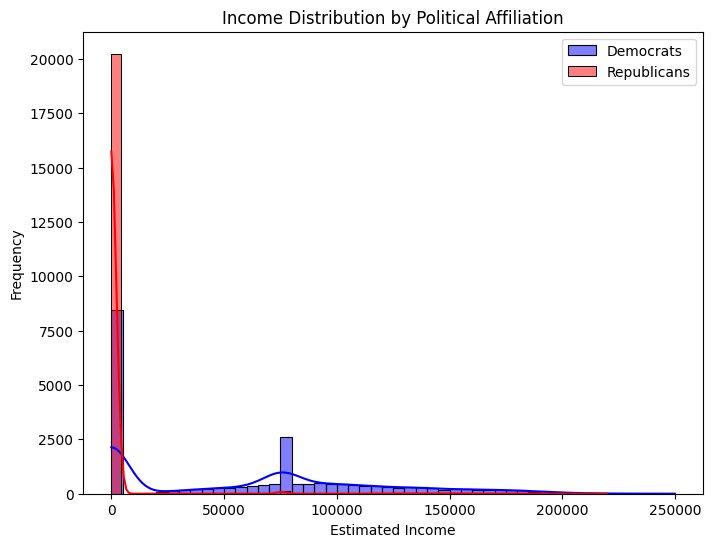

In [ ]:
plt.figure(figsize=(8,6))
sns.histplot(df["Income_per_Democrats"], bins=50, kde=True, label="Democrats", color='blue')
sns.histplot(df["Income_per_Republicans"], bins=50, kde=True, label="Republicans", color='red')
plt.xlabel("Estimated Income")
plt.ylabel("Frequency")
plt.title("Income Distribution by Political Affiliation")
plt.legend()
plt.show()

Actual vs Predicted Income

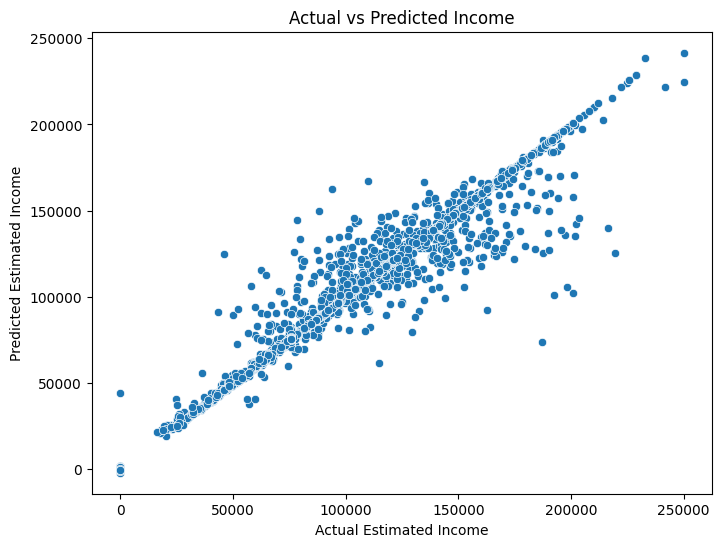

In [ ]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=y_test, y=y_pred)
plt.xlabel("Actual Estimated Income")
plt.ylabel("Predicted Estimated Income")
plt.title("Actual vs Predicted Income")
plt.show()

In [ ]:
print(df.columns)

Index(['Unnamed: 0_x', 'STATEFP', 'COUNTYFP', 'TRACTCE', 'BLKGRPCE',
       'NAMELSAD', 'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER',
       ...
       'RLI_y', 'cluster', 'income_category', 'Estimated_Income',
       'per_dem_binary', 'per_rep_binary', 'Income_per_Democrats',
       'Income_per_Republicans', 'Income_per_Young', 'Income_per_Older'],
      dtype='object', length=469)


In [ ]:
!pip install folium geopandas contextily

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 48.6 MB/s eta 0:00:00


<ipython-input-43-72032b7a9c9e>:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['latitude'] = pd.to_numeric(df['INTPTLAT'], errors='coerce')
<ipython-input-43-72032b7a9c9e>:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['longitude'] = pd.to_numeric(df['INTPTLON'], errors='coerce')


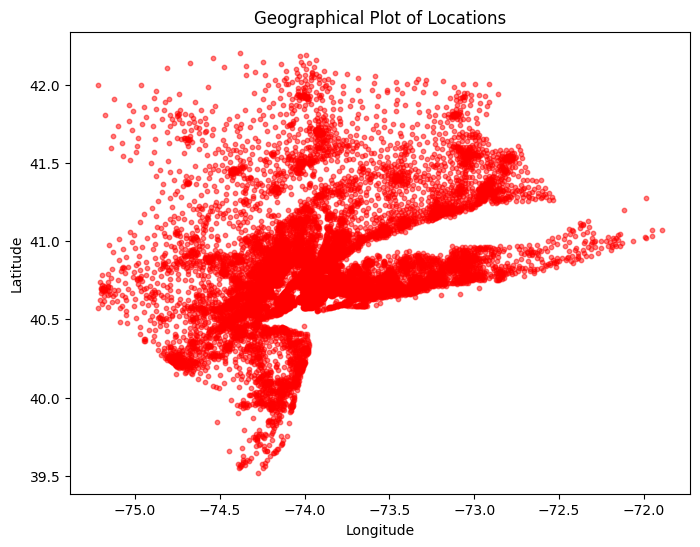

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df['latitude'] = pd.to_numeric(df['INTPTLAT'], errors='coerce')
df['longitude'] = pd.to_numeric(df['INTPTLON'], errors='coerce')
df.dropna(subset=['latitude', 'longitude'], inplace=True)
plt.figure(figsize=(8,6))
plt.scatter(df['longitude'], df['latitude'], alpha=0.5, s=10, c='red')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Geographical Plot of Locations")
plt.show()

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

try:
    df = pd.read_csv(file_path, dtype={'GEO_ID': str})

    gdf = gpd.read_file(RLI_path)

    print("Files loaded successfully!")

except FileNotFoundError as e:
    print(f"File not found: {e}")
    raise

except Exception as e:
    print(f"Error loading data: {e}")
    raise

<ipython-input-44-8a2b10f87452>:6: DtypeWarning: Columns (225,260,360) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path, dtype={'GEO_ID': str})


Files loaded successfully!


In [ ]:
!pip install geopandas

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

csv_file = "10marchfinal-1 (1).csv"
geojson_file = "RLI_CBG_MSA.geojson"

In [ ]:
print("CSV Columns:", df.columns)
print("GeoJSON Columns:", gdf.columns)

CSV Columns: Index(['Unnamed: 0_x', 'GEO_ID', 'STATEFP', 'COUNTYFP', 'TRACTCE', 'BLKGRPCE',
       'NAMELSAD', 'MTFCC', 'FUNCSTAT', 'ALAND',
       ...
       'B14002_047E', 'B14002_047M', 'B14002_048E', 'B14002_048M',
       'B14002_049E', 'B14002_049M', 'Unnamed: 100_y', 'RLI_x', 'Unnamed: 0_y',
       'RLI_y'],
      dtype='object', length=463)
GeoJSON Columns: Index(['field_1', 'RLI'], dtype='object')


In [ ]:
geojson_file_path = "/content/drive/My Drive/Final_Data/RLI_CBG_MSA.geojson"

In [ ]:
column_to_plot = "RLI"

In [ ]:
import json
from shapely.geometry import shape, Polygon, MultiPolygon
import geopandas as gpd

geojson_file = "RLI_CBG_MSA.geojson"

with open(geojson_file, "r") as f:
    geojson_data = json.load(f)

for feature in geojson_data["features"]:
    geom = shape(feature["geometry"])

    if not geom.is_valid:
        print(f"Fixing invalid geometry: {feature['properties']['index']}")
        feature["geometry"] = geom.buffer(0).__geo_interface__

fixed_geojson_file = "fixed_RLI_CBG_MSA.geojson"
with open(fixed_geojson_file, "w") as f:
    json.dump(geojson_data, f)

print(f"Fixed GeoJSON saved as: {fixed_geojson_file}")

Fixed GeoJSON saved as: fixed_RLI_CBG_MSA.geojson


In [ ]:
merged_gdf = gpd.read_file(fixed_geojson_file)

columns_to_drop = ["spatial_exp", "spatial_iso"]
merged_gdf = merged_gdf.drop(columns=[col for col in columns_to_drop if col in merged_gdf.columns])

merged_gdf.to_file("cleaned_RLI_CBG_MSA.geojson", driver="GeoJSON")

print("GeoJSON successfully loaded and cleaned!")

GeoJSON successfully loaded and cleaned!


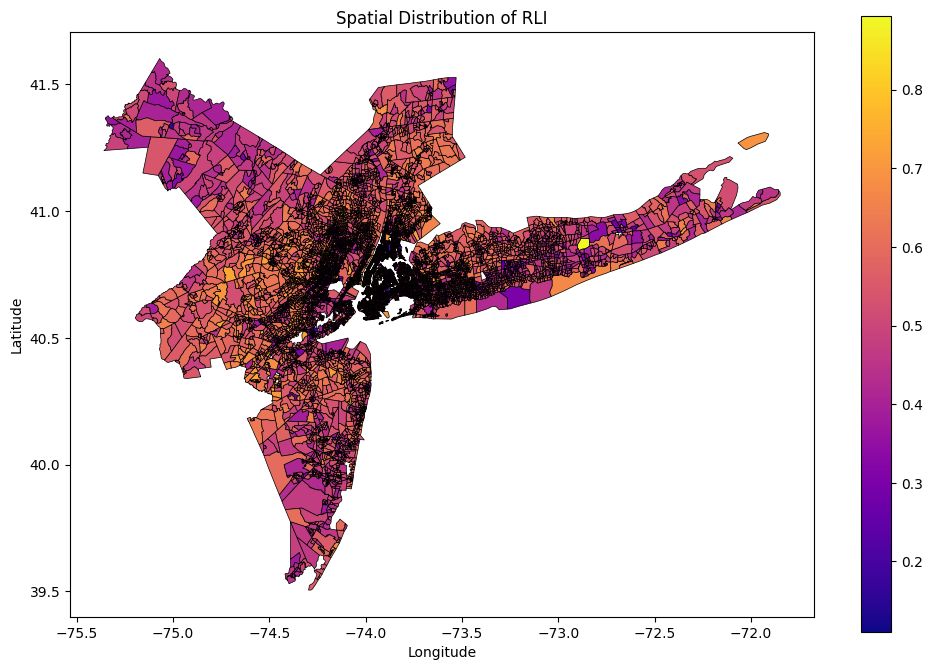

In [ ]:
fig, ax = plt.subplots(figsize=(12, 8))
merged_gdf.plot(column=column_to_plot, cmap="plasma", linewidth=0.5, edgecolor="black", legend=True, ax=ax)

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title(f"Spatial Distribution of {column_to_plot}")

plt.show()

In [ ]:
merged_gdf.plot(column=column_to_plot, cmap="plasma", linewidth=0.3, edgecolor="white", legend=True, ax=ax)

<Axes: title={'center': 'Spatial Distribution of RLI'}, xlabel='Longitude', ylabel='Latitude'>

In [ ]:
merged_gdf.plot(column="RLI", cmap="plasma", linewidth=0.5, edgecolor="white", legend=True, ax=ax)

<Axes: title={'center': 'Spatial Distribution of RLI'}, xlabel='Longitude', ylabel='Latitude'>

In [ ]:
merged_gdf["Income_Category"] = pd.cut(
    merged_gdf["RLI"],
    bins=[0, 0.3, 0.6, 1],
    labels=["Low", "Medium", "High"]
)

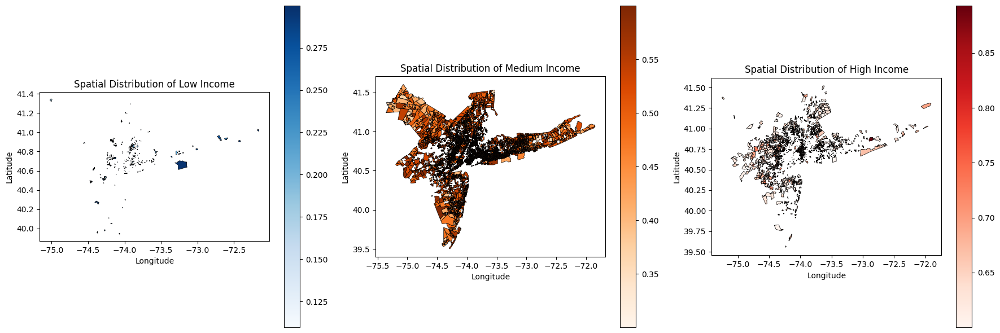

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

categories = ["Low", "Medium", "High"]
colors = ["Blues", "Oranges", "Reds"]

for i, cat in enumerate(categories):
    ax = axes[i]
    merged_gdf[merged_gdf["Income_Category"] == cat].plot(
        column="RLI", cmap=colors[i], linewidth=0.5, edgecolor="black", legend=True, ax=ax
    )
    ax.set_title(f"Spatial Distribution of {cat} Income")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

plt.tight_layout()
plt.show()

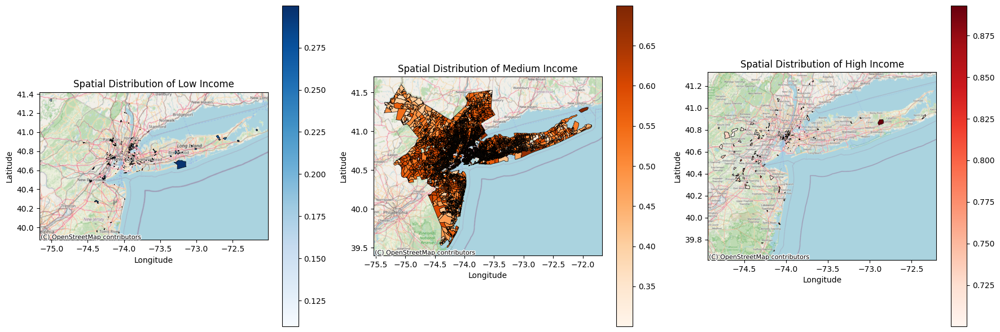

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx

gdf = gpd.read_file("fixed_RLI_CBG_MSA.geojson")

low_income = gdf[gdf["RLI"] < 0.3]
medium_income = gdf[(gdf["RLI"] >= 0.3) & (gdf["RLI"] < 0.7)]
high_income = gdf[gdf["RLI"] >= 0.7]

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

categories = [low_income, medium_income, high_income]
titles = ["Low Income", "Medium Income", "High Income"]
colors = ["Blues", "Oranges", "Reds"]

for i, (data, title, color) in enumerate(zip(categories, titles, colors)):
    ax = axes[i]
    data.plot(column="RLI", cmap=color, linewidth=0.5, edgecolor="black", legend=True, ax=ax)

    ctx.add_basemap(ax, crs=data.crs, source=ctx.providers.OpenStreetMap.Mapnik)

    ax.set_title(f"Spatial Distribution of {title}")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

plt.tight_layout()
plt.show()

In [ ]:
df.columns = df.columns.str.strip().str.replace("\n", "")

In [ ]:
income_columns = ["B19001_002E", "B19001_003E", "B19001_004E", "B19001_005E",
                  "B19001_006E", "B19001_007E", "B19001_008E", "B19001_009E",
                  "B19001_010E", "B19001_011E", "B19001_012E", "B19001_013E",
                  "B19001_014E", "B19001_015E", "B19001_016E", "B19001_017E"]

missing_cols = [col for col in income_columns if col not in df.columns]
print("Missing Columns:", missing_cols)

Missing Columns: []


In [ ]:
df["Low_Income"] = df[["B19001_002E", "B19001_003E", "B19001_004E", "B19001_005E",
                        "B19001_006E", "B19001_007E"]].sum(axis=1)  # < $60K

df["Medium_Income"] = df[["B19001_008E", "B19001_009E", "B19001_010E", "B19001_011E",
                           "B19001_012E", "B19001_013E", "B19001_014E"]].sum(axis=1)  # $60K - $199K

df["High_Income"] = df[["B19001_015E", "B19001_016E", "B19001_017E"]].sum(axis=1)  # ≥ $200K

In [ ]:
age_columns = ["B01001_003E", "B01001_004E", "B01001_005E", "B01001_006E",
               "B01001_020E", "B01001_021E", "B01001_022E", "B01001_023E",
               "B01001_024E", "B01001_025E", "B01001_026E", "B01001_027E"]

missing_age_cols = [col for col in age_columns if col not in df.columns]
print("Missing Age Columns:", missing_age_cols)

Missing Age Columns: []


In [ ]:
df["Young_Population"] = df[["B01001_003E", "B01001_004E", "B01001_005E", "B01001_006E"]].sum(axis=1)  # Under 18
df["Adult_Population"] = df[["B01001_020E", "B01001_021E", "B01001_022E", "B01001_023E"]].sum(axis=1)  # 18-64
df["Senior_Population"] = df[["B01001_024E", "B01001_025E", "B01001_026E", "B01001_027E"]].sum(axis=1)  # 65+

In [ ]:
print(df[["Low_Income", "Medium_Income", "High_Income", "Young_Population", "Adult_Population", "Senior_Population"]].head())

   Low_Income  Medium_Income  High_Income  Young_Population  Adult_Population  \
0       127.0          277.0        157.0             101.0              28.0   
1       127.0          277.0        157.0             101.0              28.0   
2       127.0          277.0        157.0             101.0              28.0   
3       127.0          277.0        157.0             101.0              28.0   
4       496.0          370.0        526.0              70.0              56.0   

   Senior_Population  
0              868.0  
1              868.0  
2              868.0  
3              868.0  
4              922.0  


In [ ]:
from shapely import wkt
import geopandas as gpd

df['geometry_x'] = df['geometry_x'].apply(wkt.loads)
df = gpd.GeoDataFrame(df, geometry='geometry_x')

print(df.geometry.head())

0    POLYGON ((-73.94112 40.83166, -73.94088 40.832...
1    POLYGON ((-73.94112 40.83166, -73.94088 40.832...
2    POLYGON ((-73.94112 40.83166, -73.94088 40.832...
3    POLYGON ((-73.94112 40.83166, -73.94088 40.832...
4    POLYGON ((-73.98806 40.76979, -73.98666 40.769...
Name: geometry_x, dtype: geometry


In [ ]:
df = gpd.GeoDataFrame(df, geometry=df["geometry_x"])

In [ ]:
print(df.crs)

None


In [ ]:
df.set_crs(epsg=4326, inplace=True)

,Unnamed: 0_x,GEO_ID,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,RLI_x,Unnamed: 0_y,RLI_y,Low_Income,Medium_Income,High_Income,Young_Population,Adult_Population,Senior_Population,geometry
0,0,360610239001,36,61,23900,1,Block Group 1,G5030,S,27517,...,0.501265,3.606102e+11,0.501265,127.0,277.0,157.0,101.0,28.0,868.0,"POLYGON ((-73.94112 40.83166, -73.94088 40.832..."
1,0,360610239001,36,61,23900,1,Block Group 1,G5030,S,27517,...,0.501265,3.606102e+11,0.501265,127.0,277.0,157.0,101.0,28.0,868.0,"POLYGON ((-73.94112 40.83166, -73.94088 40.832..."
2,0,360610239001,36,61,23900,1,Block Group 1,G5030,S,27517,...,0.501265,3.606102e+11,0.501265,127.0,277.0,157.0,101.0,28.0,868.0,"POLYGON ((-73.94112 40.83166, -73.94088 40.832..."
3,0,360610239001,36,61,23900,1,Block Group 1,G5030,S,27517,...,0.501265,3.606102e+11,0.501265,127.0,277.0,157.0,101.0,28.0,868.0,"POLYGON ((-73.94112 40.83166, -73.94088 40.832..."
4,1,360610139001,36,61,13900,1,Block Group 1,G5030,S,23621,...,0.613339,3.606101e+11,0.613339,496.0,370.0,526.0,70.0,56.0,922.0,"POLYGON ((-73.98806 40.76979, -73.98666 40.769..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20826,17292,90012305022,9,1,230502,2,Block Group 2,G5030,S,6534670,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON ((-73.23712 41.39575, -73.23594 41.395..."
20827,17293,90093515003,9,9,351500,3,Block Group 3,G5030,S,410387,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON ((-73.04011 41.52792, -73.03956 41.529..."
20828,17294,90093515004,9,9,351500,4,Block Group 4,G5030,S,1325370,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON ((-73.04742 41.51542, -73.04674 41.516..."
20829,17295,90093516011,9,9,351601,1,Block Group 1,G5030,S,372268,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,"POLYGON ((-73.05831 41.55034, -73.05811 41.550..."


In [ ]:
print(df.crs)


EPSG:4326


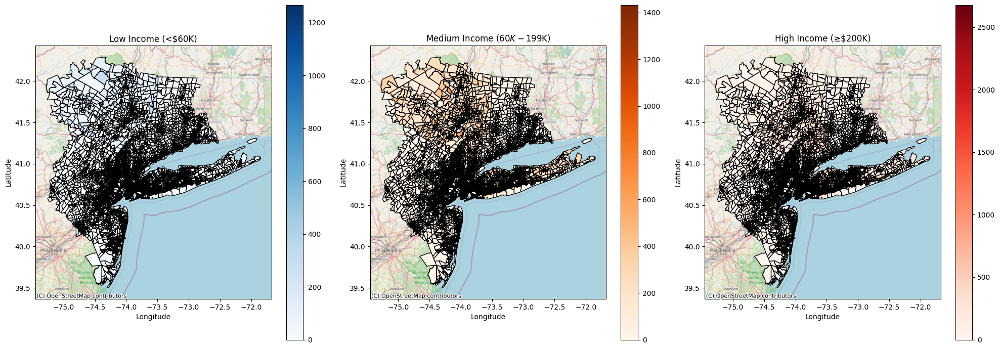

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(20, 7))

for ax, income_col, title, cmap in zip(
    axes, ["Low_Income", "Medium_Income", "High_Income"],
    ["Low Income (<$60K)", "Medium Income ($60K-$199K)", "High Income (≥$200K)"],
    ["Blues", "Oranges", "Reds"]
):
    df.plot(column=income_col, cmap=cmap, edgecolor="black", legend=True, ax=ax)
    ctx.add_basemap(ax, crs=df.crs, source=ctx.providers.OpenStreetMap.Mapnik)
    ax.set_title(title)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

plt.tight_layout()
plt.show()

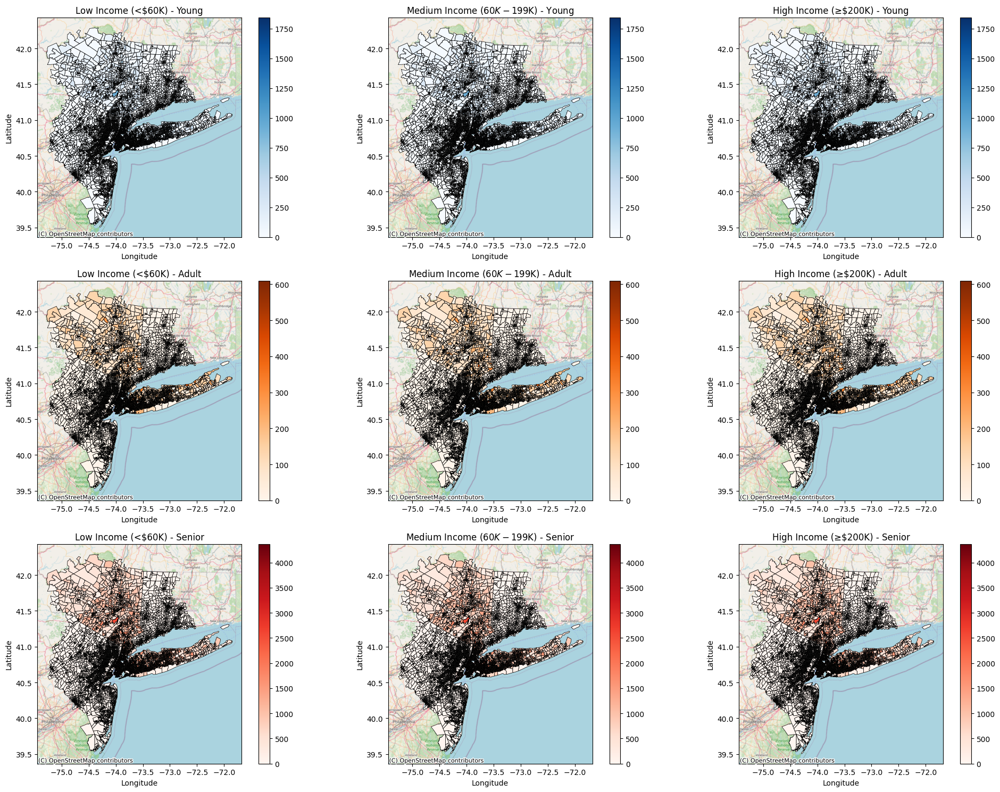

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx

income_groups = ["Low_Income", "Medium_Income", "High_Income"]
income_titles = ["Low Income (<$60K)", "Medium Income ($60K-$199K)", "High Income (≥$200K)"]

age_groups = ["Young_Population", "Adult_Population", "Senior_Population"]
age_titles = ["Young", "Adult", "Senior"]

colors = ["Blues", "Oranges", "Reds"]

fig, axes = plt.subplots(3, 3, figsize=(20, 15))

for i, (income_col, income_title) in enumerate(zip(income_groups, income_titles)):
    for j, (age_col, age_title) in enumerate(zip(age_groups, age_titles)):
        ax = axes[j, i]

        df.plot(column=age_col, cmap=colors[j], linewidth=0.5, edgecolor="black", legend=True, ax=ax)

        ctx.add_basemap(ax, crs=df.crs, source=ctx.providers.OpenStreetMap.Mapnik)

        ax.set_title(f"{income_title} - {age_title}")
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")

plt.tight_layout()
plt.show()

In [ ]:
print(df[["Young_Population", "Adult_Population", "Senior_Population"]].describe())

       Young_Population  Adult_Population  Senior_Population
count      20831.000000      20831.000000       20831.000000
mean          87.345255         45.261053         498.625366
std          112.031369         57.797554         465.782275
min            0.000000          0.000000           0.000000
25%            0.000000          0.000000           0.000000
50%           50.000000         28.000000         492.000000
75%          139.000000         72.000000         799.000000
max         1841.000000        609.000000        4364.000000


In [ ]:
df = df.rename(columns={
    'B19001_001E': 'income',
    'B01001_001E': 'total_pop',
    'B01001_002E': 'male_pop',
    'B01001_026E': 'female_pop',
    'B14002_001E': 'education',
})

In [ ]:
df['male_pct'] = df['male_pop'] / df['total_pop']
df['female_pct'] = df['female_pop'] / df['total_pop']

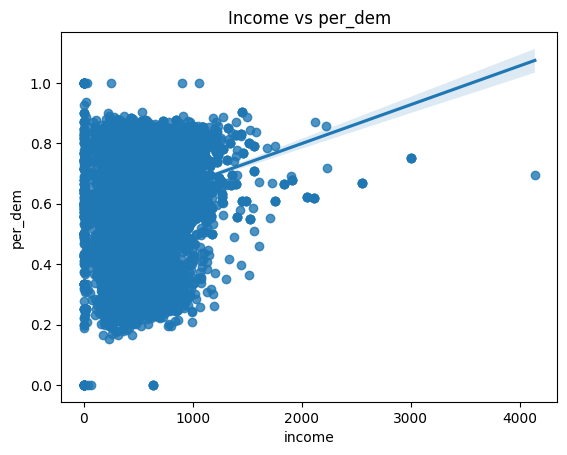

In [ ]:
sns.regplot(data=df, x='income', y='per_dem')
plt.title('Income vs per_dem')
plt.show()

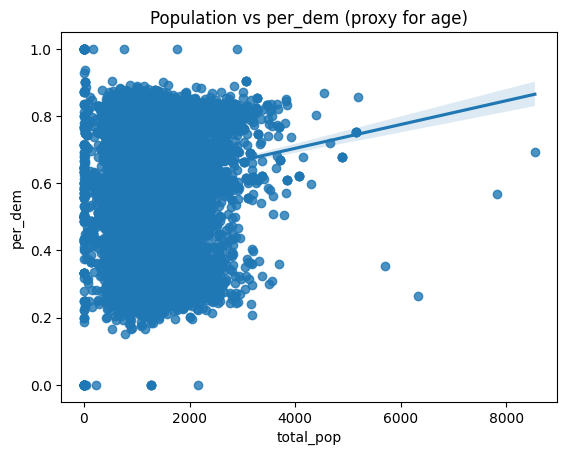

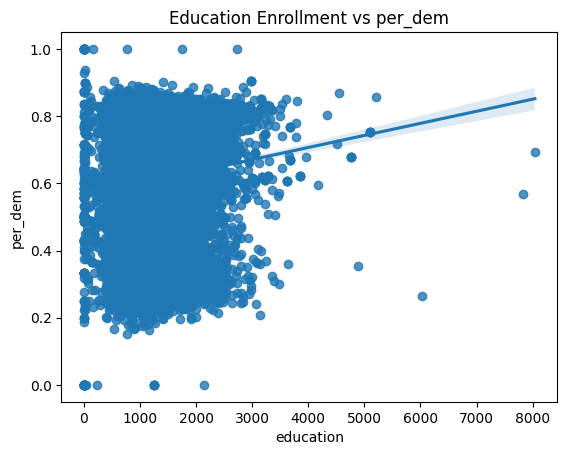

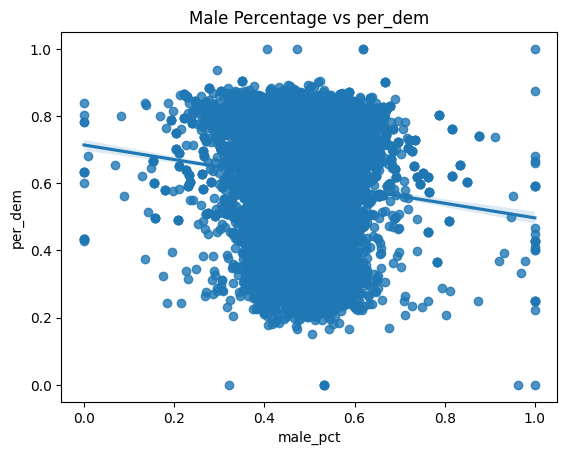

                            OLS Regression Results                            
Dep. Variable:                per_dem   R-squared:                       0.048
Model:                            OLS   Adj. R-squared:                  0.048
Method:                 Least Squares   F-statistic:                     175.2
Date:                Sat, 19 Apr 2025   Prob (F-statistic):          1.21e-146
Time:                        02:08:30   Log-Likelihood:                 4578.1
No. Observations:               13862   AIC:                            -9146.
Df Residuals:                   13857   BIC:                            -9108.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.6371      0.009     69.104      0.0

In [ ]:
sns.regplot(data=df, x='total_pop', y='per_dem')
plt.title('Population vs per_dem (proxy for age)')
plt.show()

sns.regplot(data=df, x='education', y='per_dem')
plt.title('Education Enrollment vs per_dem')
plt.show()

sns.regplot(data=df, x='male_pct', y='per_dem')
plt.title('Male Percentage vs per_dem')
plt.show()

import statsmodels.formula.api as smf
model = smf.ols('per_dem ~ income + total_pop + education + male_pct', data=df).fit()
print(model.summary())


In [ ]:

df_age_gender = pd.read_csv('ACSDT5Y2020.B01001-Data.csv')

age_gender_cols = [col for col in df_age_gender.columns if 'B01001' in col and col.endswith('E')]
df_age_gender[age_gender_cols] = df_age_gender[age_gender_cols].apply(pd.to_numeric, errors='coerce')

<ipython-input-80-cce3d8b75eed>:1: DtypeWarning: Columns (2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99) have mixed types. Specify dtype option on import or set low_memory=False.
  df_age_gender = pd.read_csv('ACSDT5Y2020.B01001-Data.csv')


In [ ]:
df_age_gender['Male_Total'] = df_age_gender['B01001_002E']
df_age_gender['Female_Total'] = df_age_gender['B01001_026E']

In [ ]:
gender_summary = df_age_gender[['Male_Total', 'Female_Total']].sum().reset_index()
gender_summary.columns = ['Gender', 'Population']

<ipython-input-84-8cc389bf39a9>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Gender', y='Population', data=gender_summary, palette='viridis')


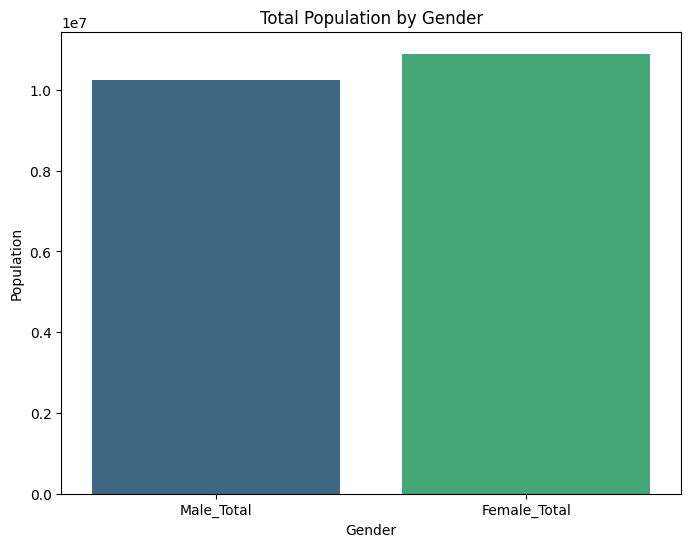

In [ ]:
plt.figure(figsize=(8,6))
sns.barplot(x='Gender', y='Population', data=gender_summary, palette='viridis')
plt.title('Total Population by Gender')
plt.show()

In [ ]:
age_groups = {
    'Under 18': ['B01001_003E', 'B01001_004E', 'B01001_005E', 'B01001_006E',
                 'B01001_027E', 'B01001_028E', 'B01001_029E', 'B01001_030E'],
    '18-34': ['B01001_007E', 'B01001_008E', 'B01001_009E', 'B01001_010E', 'B01001_011E', 'B01001_012E',
              'B01001_031E', 'B01001_032E', 'B01001_033E', 'B01001_034E', 'B01001_035E', 'B01001_036E'],
    '35-64': ['B01001_013E', 'B01001_014E', 'B01001_015E', 'B01001_016E', 'B01001_017E', 'B01001_018E', 'B01001_019E',
              'B01001_037E', 'B01001_038E', 'B01001_039E', 'B01001_040E', 'B01001_041E', 'B01001_042E', 'B01001_043E'],
    '65 and over': ['B01001_020E', 'B01001_021E', 'B01001_022E', 'B01001_023E', 'B01001_024E', 'B01001_025E',
                    'B01001_044E', 'B01001_045E', 'B01001_046E', 'B01001_047E', 'B01001_048E', 'B01001_049E']
}

In [ ]:
age_summary = pd.DataFrame({
    'Age_Group': age_groups.keys(),
    'Population': [df_age_gender[cols].sum().sum() for cols in age_groups.values()]
})

<ipython-input-87-8e6711fe0a31>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Age_Group', y='Population', data=age_summary, palette='coolwarm')


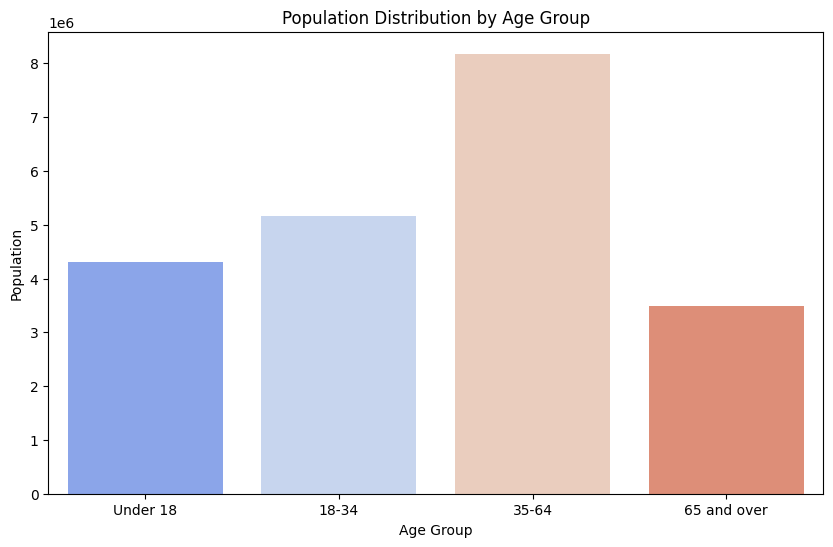

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(x='Age_Group', y='Population', data=age_summary, palette='coolwarm')
plt.title('Population Distribution by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Population')
plt.show()

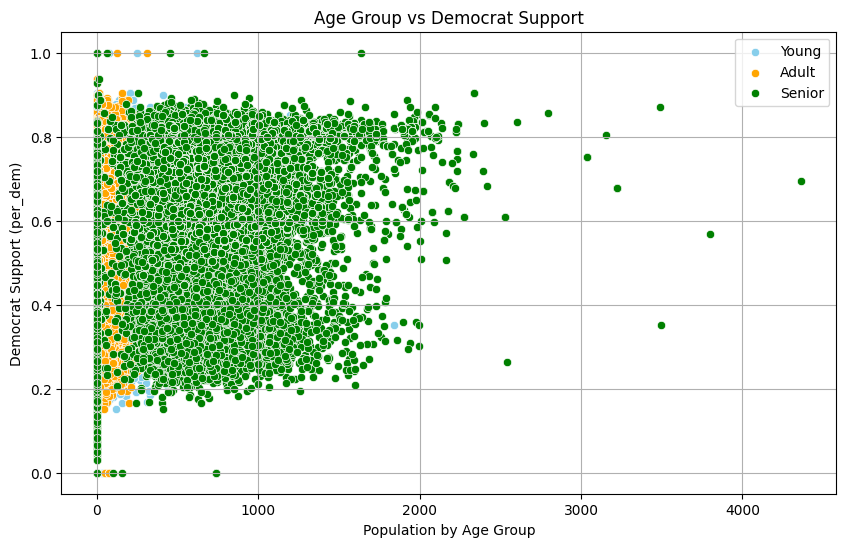

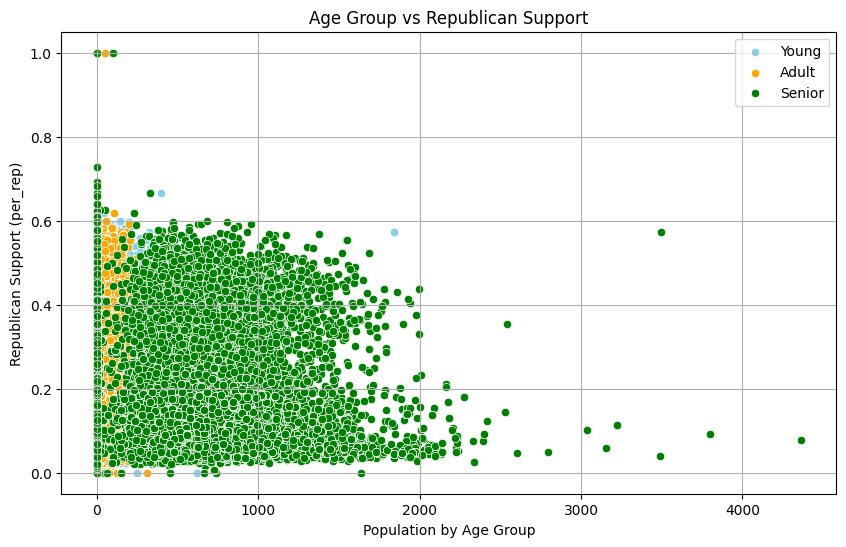

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Young_Population', y='per_dem', label='Young', color='skyblue')
sns.scatterplot(data=df, x='Adult_Population', y='per_dem', label='Adult', color='orange')
sns.scatterplot(data=df, x='Senior_Population', y='per_dem', label='Senior', color='green')
plt.title('Age Group vs Democrat Support')
plt.xlabel('Population by Age Group')
plt.ylabel('Democrat Support (per_dem)')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Young_Population', y='per_rep', label='Young', color='skyblue')
sns.scatterplot(data=df, x='Adult_Population', y='per_rep', label='Adult', color='orange')
sns.scatterplot(data=df, x='Senior_Population', y='per_rep', label='Senior', color='green')
plt.title('Age Group vs Republican Support')
plt.xlabel('Population by Age Group')
plt.ylabel('Republican Support (per_rep)')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
gdf = gpd.GeoDataFrame(df, geometry='geometry_x')
gdf.crs = "EPSG:4326"

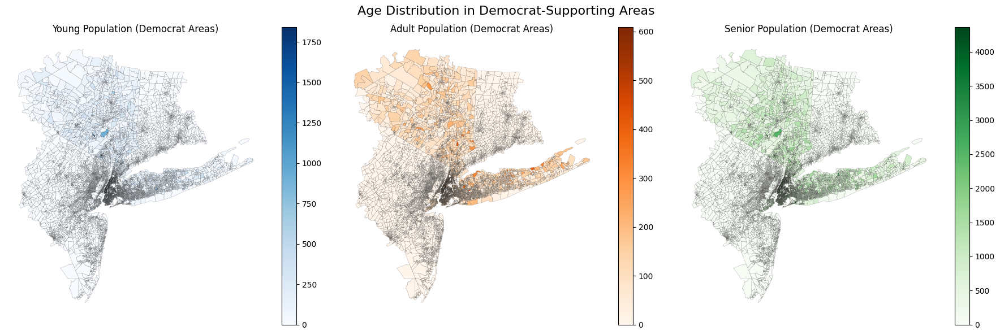

In [ ]:
gdf['dem_support_level'] = pd.cut(gdf['per_dem'], bins=[0, 0.3, 0.7, 1], labels=['Low', 'Medium', 'High'])

fig, axs = plt.subplots(1, 3, figsize=(18, 6))
age_columns = ['Young_Population', 'Adult_Population', 'Senior_Population']
titles = ['Young', 'Adult', 'Senior']
colors = ['Blues', 'Oranges', 'Greens']

for ax, col, title, cmap in zip(axs, age_columns, titles, colors):
    gdf.plot(column=col, cmap=cmap, legend=True, ax=ax, edgecolor='black', linewidth=0.1)
    ax.set_title(f"{title} Population (Democrat Areas)")
    ax.axis('off')

plt.suptitle('Age Distribution in Democrat-Supporting Areas', fontsize=16)
plt.tight_layout()
plt.show()

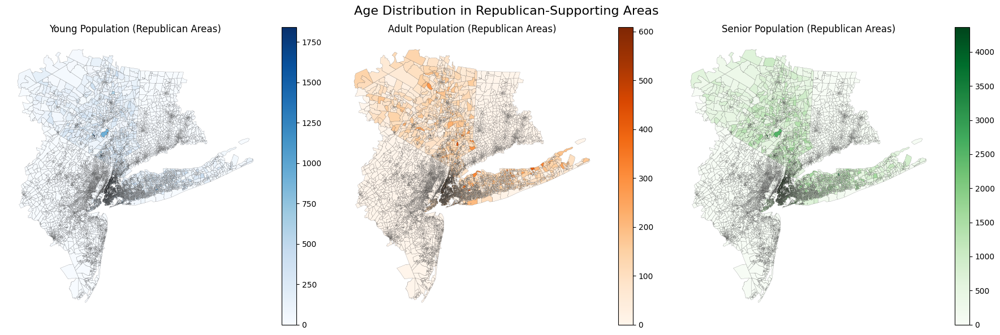

In [ ]:
gdf['rep_support_level'] = pd.cut(gdf['per_rep'], bins=[0, 0.3, 0.7, 1], labels=['Low', 'Medium', 'High'])

fig, axs = plt.subplots(1, 3, figsize=(18, 6))
titles = ['Young', 'Adult', 'Senior']

for ax, col, title, cmap in zip(axs, age_columns, titles, colors):
    gdf.plot(column=col, cmap=cmap, legend=True, ax=ax, edgecolor='black', linewidth=0.1)
    ax.set_title(f"{title} Population (Republican Areas)")
    ax.axis('off')

plt.suptitle('Age Distribution in Republican-Supporting Areas', fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
low_income = df[['B19001_002E', 'B19001_003E', 'B19001_004E']].sum(axis=1)
medium_income = df[['B19001_005E', 'B19001_006E', 'B19001_007E', 'B19001_008E']].sum(axis=1)
high_income = df[['B19001_009E', 'B19001_010E', 'B19001_011E', 'B19001_012E',
                  'B19001_013E', 'B19001_014E', 'B19001_015E', 'B19001_016E', 'B19001_017E']].sum(axis=1)

total_households = df['B19001_001M']

df['low_income_pct'] = low_income / total_households.replace(0, np.nan)
df['medium_income_pct'] = medium_income / total_households.replace(0, np.nan)
df['high_income_pct'] = high_income / total_households.replace(0, np.nan)

In [ ]:
college_columns = [
    'B14002_030E', 'B14002_031E', 'B14002_032E', 'B14002_033E',
    'B14002_038E', 'B14002_039E', 'B14002_040E', 'B14002_041E'
]
df['college_or_higher_total'] = df[college_columns].sum(axis=1)

edu_columns = [col for col in df.columns if col.startswith('B14002_') and col.endswith('E')]
df['education_total_proxy'] = df[edu_columns].sum(axis=1)

df['college_or_higher_pct'] = df['college_or_higher_total'] / df['education_total_proxy']

In [ ]:
import statsmodels.api as sm
df_clean = df[['low_income_pct', 'medium_income_pct', 'high_income_pct', 'college_or_higher_pct', 'per_dem', 'per_rep']].replace([np.inf, -np.inf], np.nan).dropna()

features = df_clean[['low_income_pct', 'medium_income_pct', 'high_income_pct', 'college_or_higher_pct']]
features = sm.add_constant(features)

y_dem = df_clean['per_dem']
y_rep = df_clean['per_rep']

In [ ]:
model_dem = sm.OLS(y_dem, features).fit()
model_rep = sm.OLS(y_rep, features).fit()

print(model_dem.summary())
print(model_rep.summary())

                            OLS Regression Results                            
Dep. Variable:                per_dem   R-squared:                       0.190
Model:                            OLS   Adj. R-squared:                  0.190
Method:                 Least Squares   F-statistic:                     813.7
Date:                Sat, 19 Apr 2025   Prob (F-statistic):               0.00
Time:                        02:10:17   Log-Likelihood:                 5698.4
No. Observations:               13862   AIC:                        -1.139e+04
Df Residuals:                   13857   BIC:                        -1.135e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.65

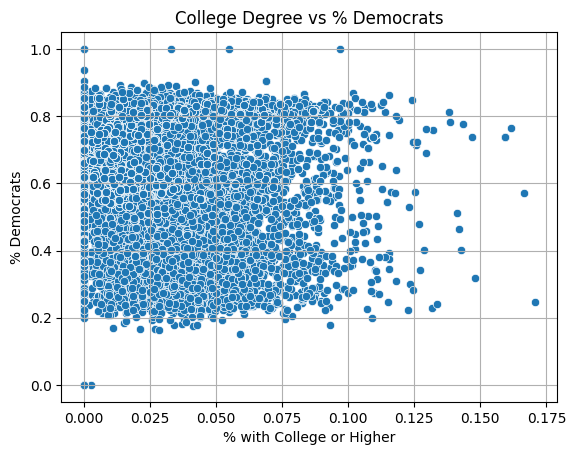

In [ ]:
sns.scatterplot(data=df, x='college_or_higher_pct', y='per_dem')
plt.title('College Degree vs % Democrats')
plt.xlabel('% with College or Higher')
plt.ylabel('% Democrats')
plt.grid(True)
plt.show()

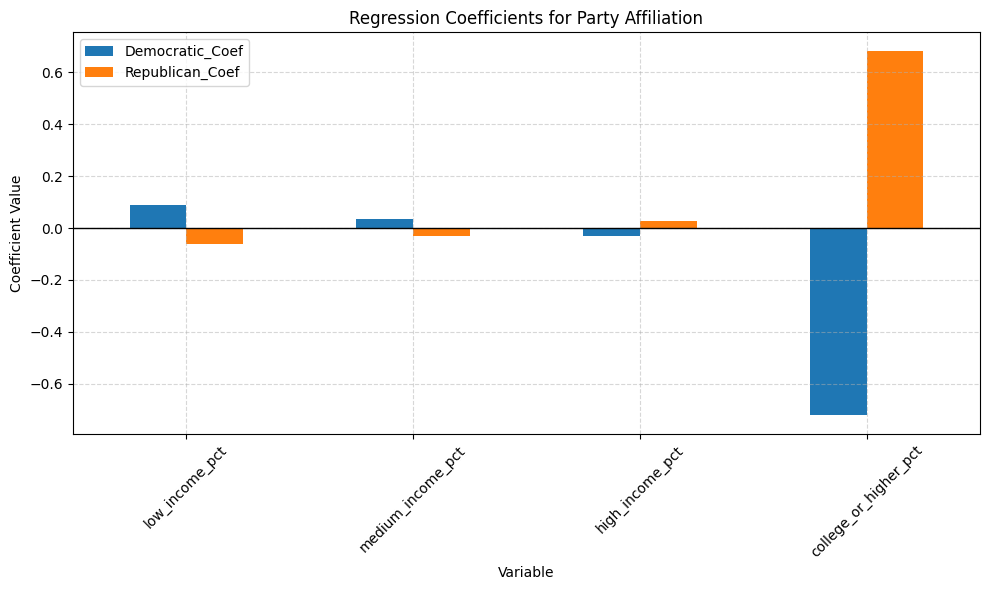

In [ ]:
coef_df = pd.DataFrame({
    'Variable': features.columns,
    'Democratic_Coef': model_dem.params.values,
    'Republican_Coef': model_rep.params.values
}).set_index('Variable')

coef_df = coef_df.drop('const')

coef_df.plot(kind='bar', figsize=(10, 6))
plt.title('Regression Coefficients for Party Affiliation')
plt.ylabel('Coefficient Value')
plt.axhline(0, color='black', linewidth=1)
plt.grid(True, linestyle='--', alpha=0.5)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

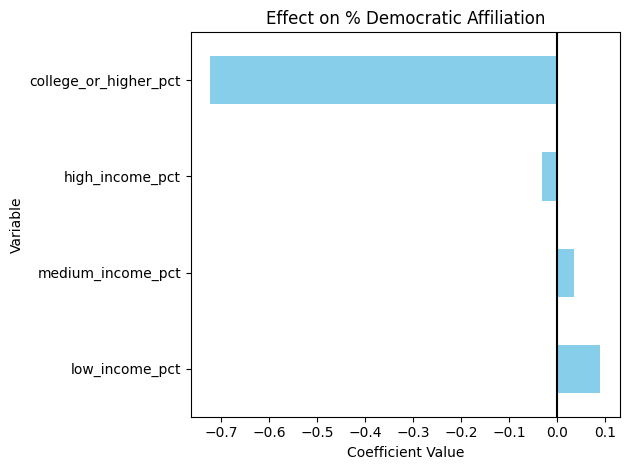

In [ ]:
coef_df['Democratic_Coef'].plot(kind='barh', color='skyblue')
plt.title('Effect on % Democratic Affiliation')
plt.xlabel('Coefficient Value')
plt.axvline(0, color='black')
plt.tight_layout()
plt.show()


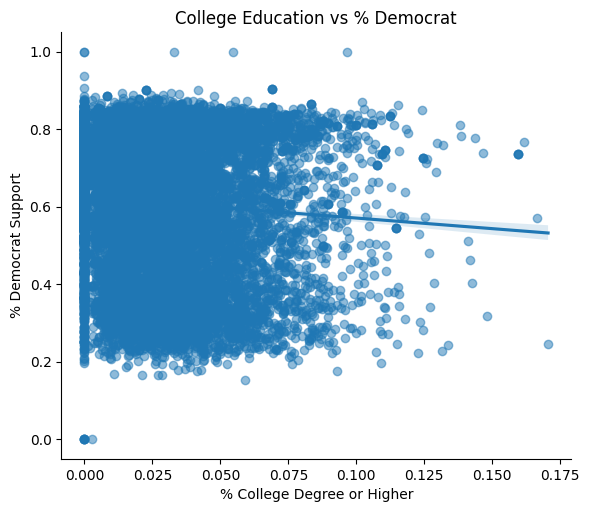

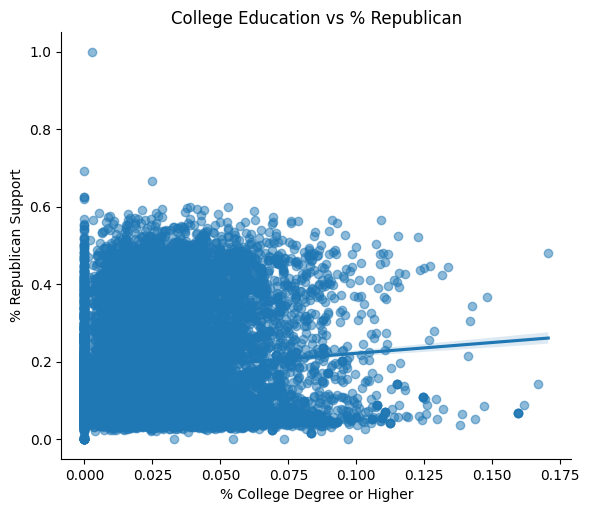

In [ ]:
sns.lmplot(data=df, x='college_or_higher_pct', y='per_dem', height=5, aspect=1.2, scatter_kws={'alpha':0.5})
plt.title('College Education vs % Democrat')
plt.xlabel('% College Degree or Higher')
plt.ylabel('% Democrat Support')
plt.show()

sns.lmplot(data=df, x='college_or_higher_pct', y='per_rep', height=5, aspect=1.2, scatter_kws={'alpha':0.5})
plt.title('College Education vs % Republican')
plt.xlabel('% College Degree or Higher')
plt.ylabel('% Republican Support')
plt.show()

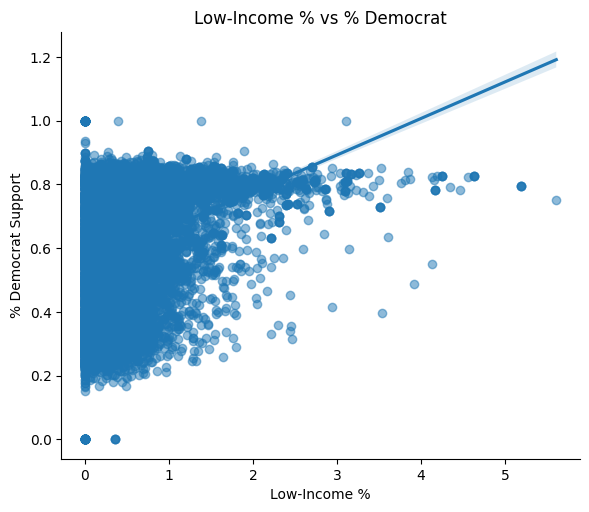

In [ ]:
sns.lmplot(data=df, x='low_income_pct', y='per_dem', height=5, aspect=1.2, scatter_kws={'alpha': 0.5})
plt.title('Low-Income % vs % Democrat')
plt.xlabel('Low-Income %')
plt.ylabel('% Democrat Support')
plt.show()

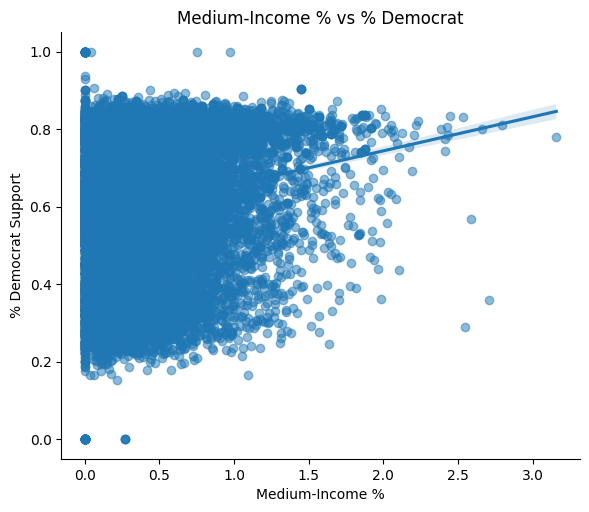

In [ ]:
sns.lmplot(data=df, x='medium_income_pct', y='per_dem', height=5, aspect=1.2, scatter_kws={'alpha': 0.5})
plt.title('Medium-Income % vs % Democrat')
plt.xlabel('Medium-Income %')
plt.ylabel('% Democrat Support')
plt.show()

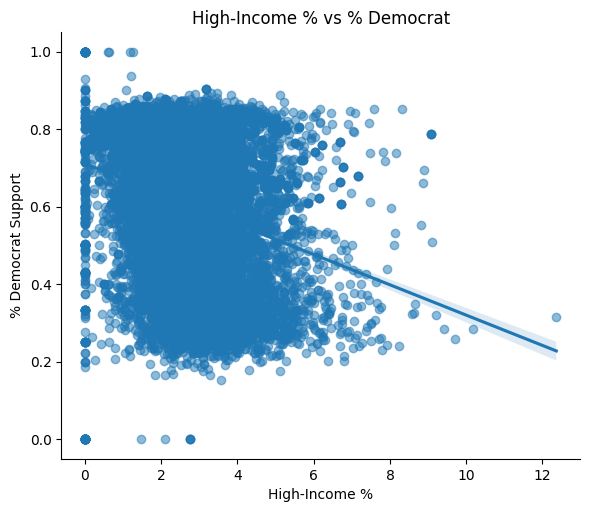

In [ ]:
sns.lmplot(data=df, x='high_income_pct', y='per_dem', height=5, aspect=1.2, scatter_kws={'alpha': 0.5})
plt.title('High-Income % vs % Democrat')
plt.xlabel('High-Income %')
plt.ylabel('% Democrat Support')
plt.show()

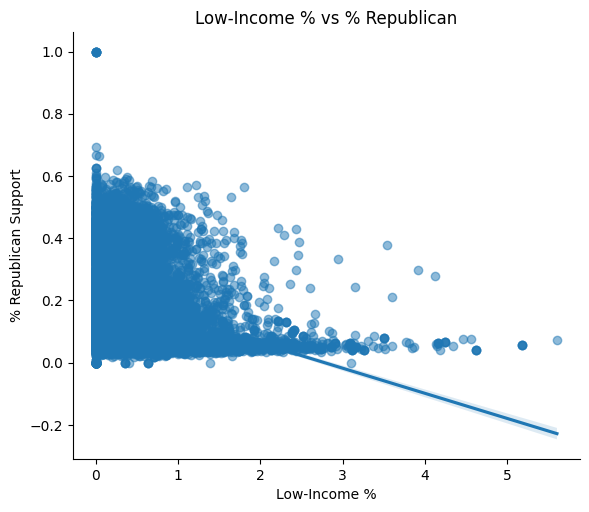

In [ ]:
sns.lmplot(data=df, x='low_income_pct', y='per_rep', height=5, aspect=1.2, scatter_kws={'alpha': 0.5})
plt.title('Low-Income % vs % Republican')
plt.xlabel('Low-Income %')
plt.ylabel('% Republican Support')
plt.show()

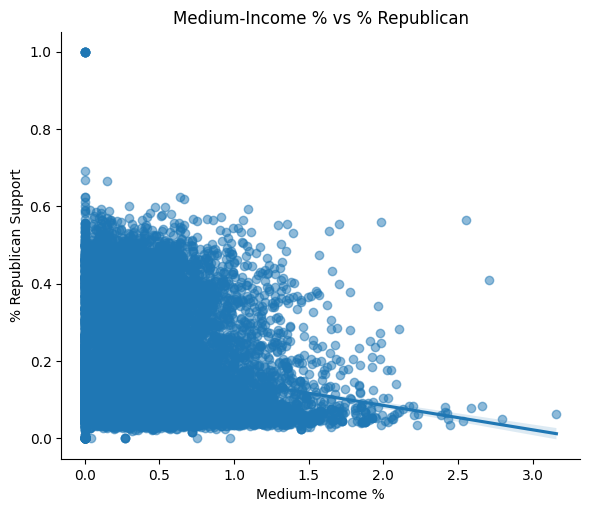

In [ ]:
sns.lmplot(data=df, x='medium_income_pct', y='per_rep', height=5, aspect=1.2, scatter_kws={'alpha': 0.5})
plt.title('Medium-Income % vs % Republican')
plt.xlabel('Medium-Income %')
plt.ylabel('% Republican Support')
plt.show()

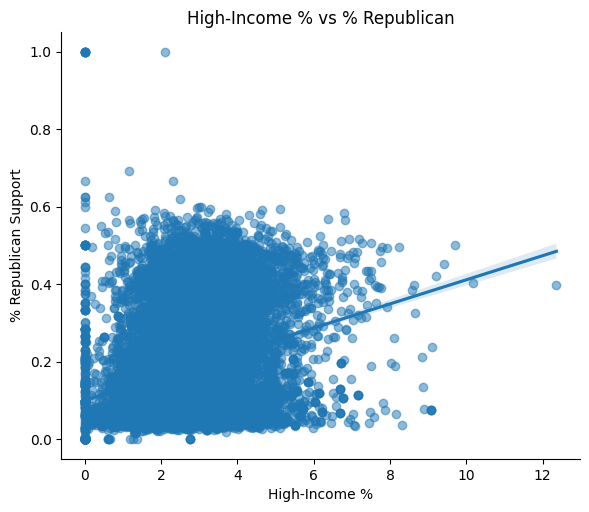

In [ ]:
sns.lmplot(data=df, x='high_income_pct', y='per_rep', height=5, aspect=1.2, scatter_kws={'alpha': 0.5})
plt.title('High-Income % vs % Republican')
plt.xlabel('High-Income %')
plt.ylabel('% Republican Support')
plt.show()

In [ ]:
medium_edu_cols = [
    'B14002_016E', 'B14002_017E', 'B14002_018E',
    'B14002_040E', 'B14002_041E', 'B14002_042E'
]
high_edu_cols = [
    'B14002_019E', 'B14002_020E', 'B14002_021E',
    'B14002_022E', 'B14002_023E', 'B14002_024E',
    'B14002_043E', 'B14002_044E', 'B14002_045E',
    'B14002_046E', 'B14002_047E', 'B14002_048E'
]
edu_columns = [col for col in df.columns if col.startswith('B14002_') and col.endswith('E')]
df['education_total_proxy'] = df[edu_columns].sum(axis=1)

df['medium_edu_pct'] = df[medium_edu_cols].sum(axis=1) / df['education_total_proxy']
df['high_edu_pct'] = df[high_edu_cols].sum(axis=1) / df['education_total_proxy']
df['low_edu_pct'] = 1 - (df['medium_edu_pct'] + df['high_edu_pct'])

In [ ]:
df['education_group'] = df[['low_edu_pct', 'medium_edu_pct', 'high_edu_pct']].idxmax(axis=1)
df['education_group'] = df['education_group'].str.replace('_edu_pct', '').str.capitalize()

<ipython-input-107-5008d857a37e>:1: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  df['education_group'] = df[['low_edu_pct', 'medium_edu_pct', 'high_edu_pct']].idxmax(axis=1)


In [ ]:
df['income_group'] = pd.cut(
    df['RLI_x'],
    bins=[0, 0.3, 0.7, 1],
    labels=['Low Income', 'Medium Income', 'High Income']
)

In [ ]:
grouped = df.groupby(['income_group', 'education_group'])[['per_dem', 'per_rep']].mean().reset_index()

<ipython-input-109-4bc494783dfe>:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(['income_group', 'education_group'])[['per_dem', 'per_rep']].mean().reset_index()


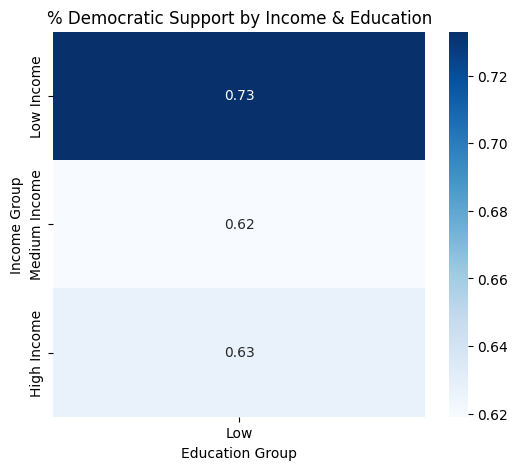

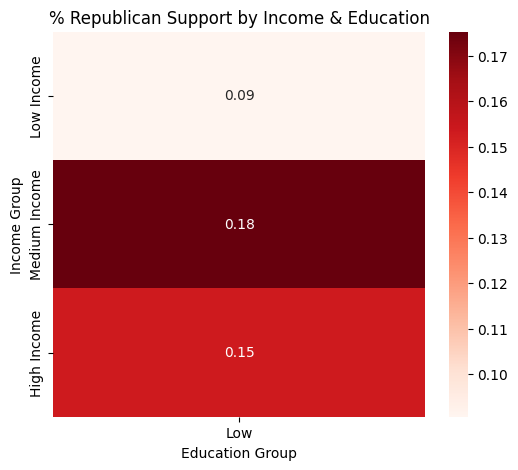

In [ ]:
# Democrat heatmap
import seaborn as sns
import matplotlib.pyplot as plt

heatmap_dem = grouped.pivot(index='income_group', columns='education_group', values='per_dem')
plt.figure(figsize=(6, 5))
sns.heatmap(heatmap_dem, annot=True, cmap='Blues', fmt=".2f")
plt.title('% Democratic Support by Income & Education')
plt.ylabel('Income Group')
plt.xlabel('Education Group')
plt.show()

# Republican heatmap
heatmap_rep = grouped.pivot(index='income_group', columns='education_group', values='per_rep')
plt.figure(figsize=(6, 5))
sns.heatmap(heatmap_rep, annot=True, cmap='Reds', fmt=".2f")
plt.title('% Republican Support by Income & Education')
plt.ylabel('Income Group')
plt.xlabel('Education Group')
plt.show()

In [ ]:
import pandas as pd
import geopandas as gpd

edu_df = pd.read_csv('ACSDT5Y2020.B14002-Data.csv', low_memory=False, encoding='latin1')
income_df = pd.read_csv('ACSDT5Y2020.B01001-Data.csv', low_memory=False, encoding='latin1')
rli_gdf = gpd.read_file('fixed_RLI_CBG_MSA.geojson')

print("✅ edu_df columns:", edu_df.columns.tolist())
print("✅ income_df columns:", income_df.columns.tolist())
print("✅ rli_gdf columns:", rli_gdf.columns.tolist())

✅ edu_df columns: ['ï»¿"GEO_ID"', 'NAME', 'B14002_001E', 'B14002_001M', 'B14002_002E', 'B14002_002M', 'B14002_003E', 'B14002_003M', 'B14002_004E', 'B14002_004M', 'B14002_005E', 'B14002_005M', 'B14002_006E', 'B14002_006M', 'B14002_007E', 'B14002_007M', 'B14002_008E', 'B14002_008M', 'B14002_009E', 'B14002_009M', 'B14002_010E', 'B14002_010M', 'B14002_011E', 'B14002_011M', 'B14002_012E', 'B14002_012M', 'B14002_013E', 'B14002_013M', 'B14002_014E', 'B14002_014M', 'B14002_015E', 'B14002_015M', 'B14002_016E', 'B14002_016M', 'B14002_017E', 'B14002_017M', 'B14002_018E', 'B14002_018M', 'B14002_019E', 'B14002_019M', 'B14002_020E', 'B14002_020M', 'B14002_021E', 'B14002_021M', 'B14002_022E', 'B14002_022M', 'B14002_023E', 'B14002_023M', 'B14002_024E', 'B14002_024M', 'B14002_025E', 'B14002_025M', 'B14002_026E', 'B14002_026M', 'B14002_027E', 'B14002_027M', 'B14002_028E', 'B14002_028M', 'B14002_029E', 'B14002_029M', 'B14002_030E', 'B14002_030M', 'B14002_031E', 'B14002_031M', 'B14002_032E', 'B14002_032M'

In [ ]:
edu_df.rename(columns={"ï»¿\"GEO_ID\"": "GEO_ID"}, inplace=True)
income_df.rename(columns={"ï»¿\"GEO_ID\"": "GEO_ID"}, inplace=True)

edu_df["GEO_ID"] = edu_df["GEO_ID"].str.replace("1500000US", "", regex=False)
income_df["GEO_ID"] = income_df["GEO_ID"].str.replace("1500000US", "", regex=False)
rli_gdf["GEO_ID"] = rli_gdf["STATEFP"] + rli_gdf["COUNTYFP"] + rli_gdf["TRACTCE"] + rli_gdf["BLKGRPCE"]

In [ ]:
edu_df["edu_total"] = pd.to_numeric(edu_df["B14002_001E"], errors="coerce")
income_df["income"] = pd.to_numeric(income_df["B01001_001E"], errors="coerce")

merged_df = (
    edu_df[["GEO_ID", "edu_total"]]
    .merge(income_df[["GEO_ID", "income"]], on="GEO_ID")
    .merge(rli_gdf[["GEO_ID", "RLI"]], on="GEO_ID")
)

clean_df = merged_df.dropna()

n_income_bins = min(clean_df["income"].nunique(), 3)
n_edu_bins = min(clean_df["edu_total"].nunique(), 3)

income_labels = ["Low Income", "Middle Income", "High Income"][:n_income_bins]
edu_labels = ["Low Education", "Medium Education", "High Education"][:n_edu_bins]

clean_df["income_group"] = pd.qcut(clean_df["income"], q=n_income_bins, labels=income_labels, duplicates="drop")
clean_df["education_group"] = pd.qcut(clean_df["edu_total"], q=n_edu_bins, labels=edu_labels, duplicates="drop")
heatmap_data = clean_df.pivot_table(
    index="income_group",
    columns="education_group",
    values="RLI",
    aggfunc="mean"
).round(2)

print(heatmap_data)

education_group  Low Education  Medium Education  High Education
income_group                                                    
Low Income                0.53              0.55             NaN
Middle Income             0.53              0.52            0.50
High Income                NaN              0.52            0.51


<ipython-input-113-7c6eae36ef9c>:20: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  heatmap_data = clean_df.pivot_table(


In [ ]:
heatmap_data = heatmap_data.fillna(0)

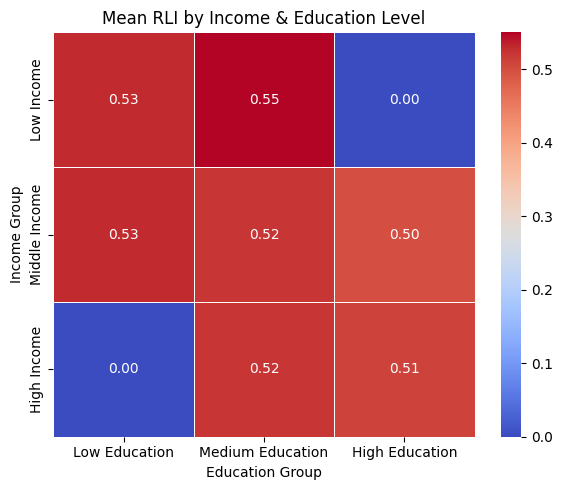

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 5))
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title("Mean RLI by Income & Education Level")
plt.xlabel("Education Group")
plt.ylabel("Income Group")
plt.tight_layout()
plt.show()

In [ ]:
X = df[['income', 'total_pop', 'education', 'male_pct', 'female_pct']]

In [ ]:
import statsmodels.api as sm

X = df[['income', 'total_pop', 'education', 'male_pct', 'female_pct']]
y = df['per_dem']

combined = pd.concat([X, y], axis=1).dropna()

X_clean = combined[['income', 'total_pop', 'education', 'male_pct', 'female_pct']]
y_clean = combined['per_dem']

X_clean = sm.add_constant(X_clean)
model = sm.OLS(y_clean, X_clean).fit()
print(model.summary())
with open("ols_summary.txt", "w") as f:
    f.write(model.summary().as_text())

                            OLS Regression Results                            
Dep. Variable:                per_dem   R-squared:                       0.048
Model:                            OLS   Adj. R-squared:                  0.048
Method:                 Least Squares   F-statistic:                     175.2
Date:                Sat, 19 Apr 2025   Prob (F-statistic):          1.21e-146
Time:                        02:10:39   Log-Likelihood:                 4578.1
No. Observations:               13862   AIC:                            -9146.
Df Residuals:                   13857   BIC:                            -9108.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.3670      0.002    152.669      0.0

In [ ]:
print(model.pvalues)

const          0.000000e+00
income         3.229593e-74
total_pop      2.169265e-10
education      1.606370e-12
male_pct       6.130219e-28
female_pct    6.768431e-205
dtype: float64


In [ ]:
print(data.columns.tolist())

['index', 'RLI', 'STATEFP', 'COUNTYFP', 'TRACTCE', 'BLKGRPCE', 'geometry']


In [ ]:
print(data.head())
print(data.columns)

            index       RLI STATEFP COUNTYFP TRACTCE BLKGRPCE  \
17   360470092011  0.723961      36      047  009201        1   
20   361031587104  0.893101      36      103  158710        4   
112  360470531011  0.748179      36      047  053101        1   
189  360470053021  0.723620      36      047  005302        1   
304  360050216021  0.723620      36      005  021602        1   

                                              geometry  
17   POLYGON ((-74.00066 40.64749, -73.99847 40.646...  
20   POLYGON ((-72.9014 40.86329, -72.90132 40.8641...  
112  POLYGON ((-73.95723 40.7, -73.95509 40.70138, ...  
189  POLYGON ((-74.00261 40.67318, -74.00229 40.673...  
304  POLYGON ((-73.86446 40.84109, -73.86358 40.841...  
Index(['index', 'RLI', 'STATEFP', 'COUNTYFP', 'TRACTCE', 'BLKGRPCE',
       'geometry'],
      dtype='object')


In [ ]:
data1 = df[['income', 'total_pop', 'education', 'male_pct', 'female_pct', 'per_dem', 'per_rep']]

In [ ]:
import statsmodels.api as sm
import pandas as pd

regressions = {
    'Low Income % vs Democrat': ('low_income_pct', 'per_dem'),
    'Low Income % vs Republican': ('low_income_pct', 'per_rep'),
    'Medium Income % vs Democrat': ('medium_income_pct', 'per_dem'),
    'Medium Income % vs Republican': ('medium_income_pct', 'per_rep'),
    'High Income % vs Democrat': ('high_income_pct', 'per_dem'),
    'High Income % vs Republican': ('high_income_pct', 'per_rep'),
}

results_list = []

for label, (x_var, y_var) in regressions.items():
    X = df[[x_var]].copy()
    X = sm.add_constant(X)
    y = df[y_var]

    model = sm.OLS(y, X, missing='drop').fit()

    results_list.append({
        'Regression': label,
        'Coefficient': round(model.params[x_var], 4),
        'Std. Error': round(model.bse[x_var], 4),
        'P-Value': f"{model.pvalues[x_var]:.2e}",
        'R-squared': round(model.rsquared, 4)
    })

summary_df = pd.DataFrame(results_list)
summary_df = summary_df.set_index("Regression")
display(summary_df)


,Coefficient,Std. Error,P-Value,R-squared
Regression,,,,
Low Income % vs Democrat,0.1147,0.0026,0.00e+00,0.1243
Low Income % vs Republican,-0.0807,0.0020,0.00e+00,0.1054
Medium Income % vs Democrat,0.0878,0.0039,3.68e-112,0.0354
Medium Income % vs Republican,-0.0631,0.0030,2.98e-99,0.0314
High Income % vs Democrat,-0.0391,0.0011,2.80e-244,0.0763
High Income % vs Republican,0.0311,0.0009,3.88e-265,0.0826
